<a href="https://colab.research.google.com/github/TheaHubner/RutgersGIS/blob/main/map.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This is my Colab. Work will be saved in Github and edited here. I can look at version history on Github and here under "File."

My project (unless I get access to my other dataset in reasonable time) will use a dataset I aqcuired from The Gun Violence Archive. This dataset contains all incidents of purposeful gun violence in America within the last 10 years. These incidents can be further divided into classifications (Purposeful Injury, Purposeful Death, Mass Shootings, Armed Robbery, and Domestic). I intend to explore the rates of these events in counties across America to identify counties with significantly high incident rates and to identify counties for which Domestic incidents are significantly different than the rates of all other types of violence.
I will continue to develop more specific research questions with Dr. Stansfield as we go.

Right now, my hypothesis is simply that rates of various types of gun violence rise parallel. I also hypothesis that counties with significantly higher rates of Domestic incidents will be rural counties.

In [ ]:
%%capture
!pip install mapclassify #sometimes have to install library which you get from https://pypi.org/

In [ ]:
import os, zipfile #basics
import pandas as pd #data management
import matplotlib.pyplot as plt #vis

import geopandas as gpd #gis/maps: a sister of pandas; does the job;
#tho not as fancy-interactive as folium or leafmap https://geopandas.org/

import mapclassify #need for thematic map classification

import seaborn as sns

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab.data_table import DataTable
DataTable.max_columns = 250

September 3 (Problem Set 0)

Here I added two shapefiles: One for states in the USA and one for counties. I would prefer to work with counties, if that is not too large a project to take on.


<Axes: >

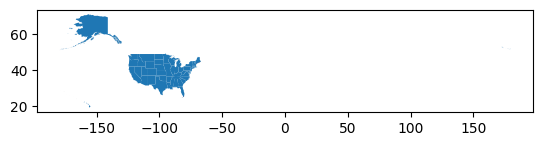

In [ ]:
#census shapefile with states in the USA
!wget -q -O us-states.zip https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip

zip_ref = zipfile.ZipFile('us-states.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping

shp_name = [f for f in os.listdir() if f.endswith('.shp')][0]
usC0 = gpd.read_file(shp_name) #load the shapefile with gpd as usC

territories = ['PR', 'GU', 'VI', 'AS', 'MP']
usC0_50 = usC0[~usC0['STUSPS'].isin(territories)]
usC0_50.plot()

<Axes: >

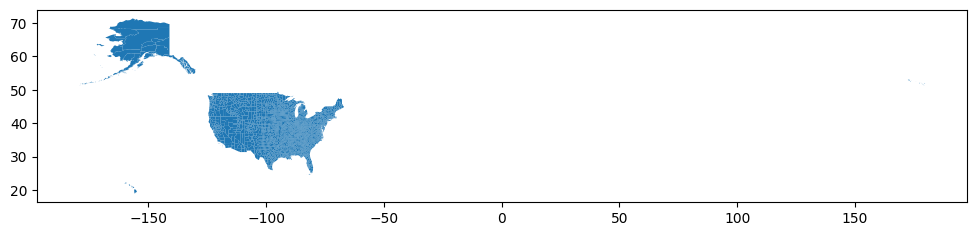

In [ ]:
#census shapefile with counties - using 5m version since 500k is currently being blocked
!wget -q -O us-counties.zip https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_county_5m.zip

zip_ref = zipfile.ZipFile('us-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping

shp_name_counties = [f for f in os.listdir() if f.endswith('.shp') and 'county' in f][0] #find the counties shapefile specifically
usCounties = gpd.read_file(shp_name_counties) #load the shapefile with gpd as usCounties

# counties don't have STUSPS, so filter territories using STATEFP instead
territory_fips = ['72', '66', '78', '60', '69']  # PR, GU, VI, AS, MP
usCounties_50 = usCounties[~usCounties['STATEFP'].isin(territory_fips)]
usCounties_50.plot(figsize=(12,8))

[sep10] Thematic Maps, color-coding polygons/lines/points

Help:
https://geographicdata.science/book/notebooks/05_choropleth.html

https://geopandas.org/en/stable/gallery/choropleths.html

https://geopandas.org/en/stable/gallery/choro_legends.html

In [ ]:
! wget -q -O nj-counties.zip https://github.com/theaok/data/raw/refs/heads/main/bounds_nj_shp.zip
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC

In [ ]:
njC0.dtypes #with geopandas can do stuff like with pandas :) need numeric for mapping

,0
COUNTY,object
COUNTY_LAB,object
CO,object
GNIS_NAME,object
GNIS,object
FIPSSTCO,object
FIPSCO,object
ACRES,float64
SQ_MILES,float64
POP2010,int64


In [ ]:
njC0.head(2)

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,POP1990,POP1980,POPDEN2010,POPDEN2000,POPDEN1990,POPDEN1980,REGION,Shape_Leng,Shape_Area,geometry
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,275372,204615,450,414,451,335,COASTAL,650228.153906,1.702385e+10,"POLYGON ((443056.01 311529.77, 443068.44 31152..."
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,829592,849843,3774,3686,3459,3544,NORTHEASTERN,443326.122021,6.686010e+09,"POLYGON ((656200.963 783614.366, 656141.127 78..."


In [ ]:
#keep it simple! always do it! and do it early!
njC=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','geometry']]

In [ ]:
njC.info() #have a look at the data: how many non-null and dtypes again

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   COUNTY      21 non-null     object  
 1   COUNTY_LAB  21 non-null     object  
 2   POP2010     21 non-null     int64   
 3   POPDEN2010  21 non-null     int64   
 4   geometry    21 non-null     geometry
dtypes: geometry(1), int64(2), object(2)
memory usage: 972.0+ bytes


In [ ]:
njC.COUNTY.value_counts(dropna=False) #any duplicates or missing

,count
COUNTY,
ATLANTIC,1
BERGEN,1
BURLINGTON,1
CAMDEN,1
CAPE MAY,1
CUMBERLAND,1
ESSEX,1
GLOUCESTER,1
HUDSON,1


<Axes: >

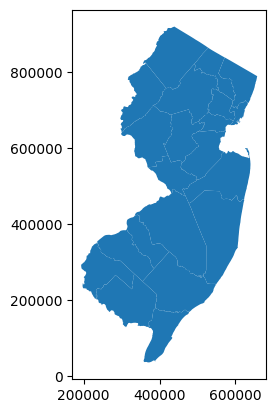

In [ ]:
njC.plot() #yay love the shape

<Axes: >

[]

[]

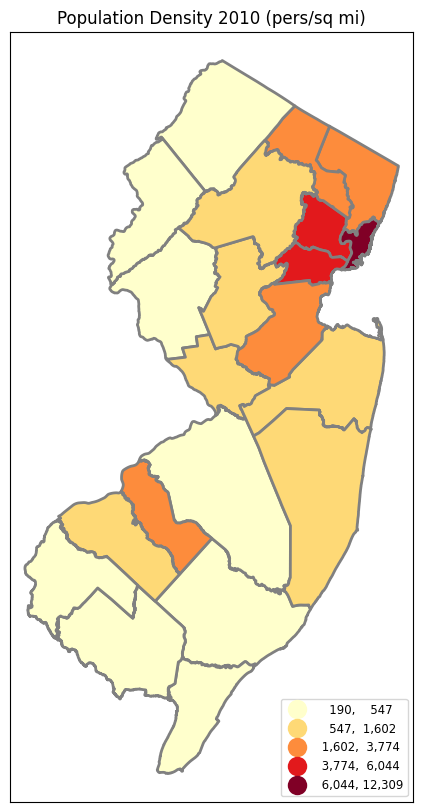

In [ ]:
#THIS IS THE KEY CODE: keep it in mind, come back to it, use it, understand it
#may put lots of comments here too
#first thematic map! lets unpack options esp fmt for dec pts; more later sec 'bells and whistles'
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POPDEN2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
#leg1 = ax.get_legend()
#leg1.set_title('''Population Density #this is legend title; useful!
#2010 (pers/sq mi)''')
ax.title.set_text("Population Density 2010 (pers/sq mi)")
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks

ax.margins(0.04) #super useful options to make map bigger in canvas; always make it as big as possible!
#ax.axis('off')
#plt.savefig('fig.pdf',bbox_inches='tight') #,pad_inches=0.1, dpi=200, transparent=True #eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff
#files.download('fig.pdf') #note can also right click fig and save image as

#btw for afficcionados, yes can further adjust the legend:
#https://stackoverflow.com/questions/52503899/format-round-numerical-legend-label-in-geopandas

In [ ]:
# we can overlay layers; lets get nj uni shapefile on it
!wget -q -O col.zip  https://github.com/theaok/data/raw/refs/heads/main/hsip_colleges.zip
zip_ref = zipfile.ZipFile('col.zip', 'r');zip_ref.extractall(); zip_ref.close()

col = gpd.read_file('2007_11_30_NJ_COLL_UNIV_njsp.shp')
col.dtypes
col.head(3)

,0
ID,object
METLNKID,object
FEATTYPE,object
SECCLASS,object
NAME,object
AREA,object
PHONE,object
ADDRESS,object
ADDRESS2,object
CITY,object


,ID,METLNKID,FEATTYPE,SECCLASS,NAME,AREA,PHONE,ADDRESS,ADDRESS2,CITY,...,X,Y,ST_VENDOR,ST_VERSION,GEOPREC,PHONELOC,QC_QA,DEGREE,ENROLL,geometry
0,10273936,None,POINT,UNCLASSIFIED,RAMAPO COLLEGE OF NEW JERSEY,201,684-7500,505 RAMAPO VALLEY RD,None,MAHWAH,...,-74.177826,41.082642,NAVTEQ,2006Q4,BLOCKFACE,None,None,MASTER'S DEGREE,5538,POINT (580936.143 819465.262)
1,10273934,None,POINT,UNCLASSIFIED,NEW BRUNSWICK THEOLOGICAL SEMINARY,732,247-5241,17 SEMINARY PL,None,NEW BRUNSWICK,...,-74.448814,40.501346,NAVTEQ,2006Q4,BLOCKFACE,None,None,DOCTOR'S DEGREE,203,POINT (506358.894 607539.257)
2,10273932,None,POINT,UNCLASSIFIED,MONMOUTH UNIVERSITY,732,571-3400,400 CEDAR AVE,None,WEST LONG BRANCH,...,-74.003765,40.281505,NAVTEQ,2006Q4,BLOCKFACE,None,None,POST-MASTER'S CERTIFICATE,6351,POINT (630565.964 527840.459)


In [ ]:
col['enr'] = col.ENROLL.astype(float)

<Axes: >

<Axes: >

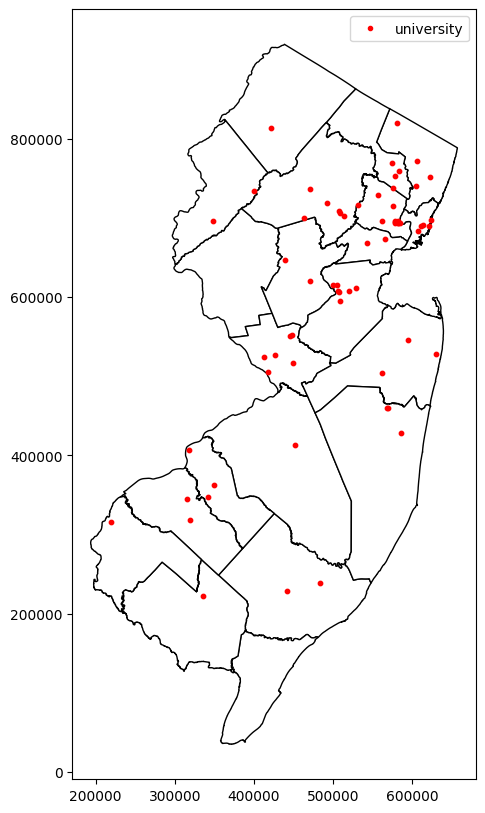

In [ ]:
#and now overlay: just use plot fn twice; remember: most maps are layered
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax, color='white', edgecolor='black',linewidth=1)
col.plot(ax=ax, marker='o', color='red', markersize=10,legend=True)
#col.plot(column='enr',markersize=50,legend=True,cmap='RdYlGn_r',scheme='QUANTILES',k=5,ax=ax)
#ax.set_title('Watersheds by area ($mi^2$)')

#custom legend
#https://stackoverflow.com/questions/39500265/how-to-manually-create-a-legend
#import matplotlib.patches as mpatches
#red_patch = mpatches.Patch(color='red', label='The red data')
from matplotlib.lines import Line2D
point = Line2D([0], [0], label='university', marker='o', markersize=3,
         markeredgecolor='r', markerfacecolor='r', linestyle='')
plt.legend(handles=[point])

## September 10: Join and Merge


1. Mount Drive
2. Import Pandas
3. Load my file (unfortunately the Excel takes a while but Box didn't work, not sure why)
4. Excel had 453394 rows (including headers). Check for match.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/My Documents/Career Documents/Rutgers University/GIS/GVA Excel.xlsx', header=6)
print(df.shape)
df.columns.tolist()

(453387, 21)


['Incident ID',
 'Date',
 'State',
 'City',
 'Business or School',
 'Address',
 'Latitude',
 'Longitude',
 '# Victims Killed',
 '# Victims Injured',
 '# Suspect Killed',
 '# Suspects Injured',
 '# Suspects Unharmed',
 '# Suspects Arrested',
 'Accidental',
 'Mass Shooting',
 'Armed Robbery',
 'Domestic Violence',
 'Shot - Wounded/Injured',
 'Shot - Dead (murder, accidental, or suicide)',
 'Incident Characteristics']

The "Incident Characteristics" column delineates the incident type. However, incidents often have multiple tags (AKA fall into multiple categories), so I need to organize them before analysis.

The five categories I am comparing:
1. Domestic Violence
2. Armed Robbery
3. Mass Shootings
4. Willful Death
5. Willful Injury

For consistency, every incident will only belong to one category based on how the incident 'began.' A domestic violence incident will be labeled as such even if it becomes a mass shooting. Same for an armed robbery. The categories  bove are listed in order. The code below creates a new column that categorizes each incident.
To due formatting issues with the em dash in 'Shot - Wounded/Injured' and 'Shot - Dead...' I edited two new column names first.

In [ ]:
dead_col = [c for c in df.columns if 'Shot' in c and 'Dead' in c][0]
injured_col = [c for c in df.columns if 'Shot' in c and 'Wounded' in c][0]

print(dead_col)
print(injured_col)

Shot - Dead (murder, accidental, or suicide)
Shot - Wounded/Injured


In [ ]:
def classify_incident(row):
    if row['Domestic Violence'] == 'x':
        return 'Domestic Violence'
    elif row['Armed Robbery'] == 'x':
        return 'Armed Robbery'
    elif row['Mass Shooting'] == 'x':
        return 'Mass Shooting'
    elif row[dead_col] == 'x':
        return 'Willful Death'
    elif row[injured_col] == 'x':
        return 'Willful Injury'
    else:
        return None

df['Incident Characteristics'] = df.apply(classify_incident, axis=1)

In [ ]:
#sanity check
df['Incident Type'].value_counts(dropna=False)

,count
Incident Type,
Willful Injury,249480
Willful Death,146954
Domestic Violence,28707
Armed Robbery,23159
Mass Shooting,5087


249480 + 146954 + 28707 + 231159 + 5087 = 453,387. It worked!

In [ ]:
# drop all of the unnecessary columns
df = df.drop(columns=[
    'Incident ID',
    'City',
    'Business or School',
    'Address',
    '# Victims Killed',
    '# Victims Injured',
    '# Suspect Killed',
    '# Suspects Injured',
    '# Suspects Unharmed',
    '# Suspects Arrested',
    'Accidental',
    'Mass Shooting',
    'Armed Robbery',
    'Domestic Violence',
    dead_col,
    injured_col,
])

print(df.shape)
df.columns.tolist()

(453387, 6)


['Date',
 'State',
 'Latitude',
 'Longitude',
 'Incident Characteristics',
 'Incident Type']

The next few cell blocks will use the latitude and longitude of each incident to match to the county FIPS codes.

In [ ]:
!pip install geopandas --quiet

In [ ]:
import geopandas as gpd
from shapely.geometry import Point

In [ ]:
# load the shapefile
!wget -q https://www2.census.gov/geo/tiger/TIGER2024/COUNTY/tl_2024_us_county.zip -O counties.zip
!unzip -q -o counties.zip -d counties
counties = gpd.read_file('counties/tl_2024_us_county.shp')
print(counties.shape)
counties.head()

(3235, 19)


,STATEFP,COUNTYFP,COUNTYNS,GEOID,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,0500000US31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477563042,10772508,+41.9158651,-096.7885168,"POLYGON ((-96.55525 41.82892, -96.55524 41.827..."
1,53,069,01513275,53069,0500000US53069,Wahkiakum,Wahkiakum County,06,H1,G4020,None,None,None,A,680980773,61564428,+46.2946377,-123.4244583,"POLYGON ((-123.72755 46.2645, -123.72756 46.26..."
2,35,011,00933054,35011,0500000US35011,De Baca,De Baca County,06,H1,G4020,None,None,None,A,6016818941,29090018,+34.3592729,-104.3686961,"POLYGON ((-104.89337 34.08894, -104.89337 34.0..."
3,31,109,00835876,31109,0500000US31109,Lancaster,Lancaster County,06,H1,G4020,339,30700,None,A,2169269508,22850511,+40.7835474,-096.6886584,"POLYGON ((-96.68493 40.5233, -96.69219 40.5231..."
4,31,129,00835886,31129,0500000US31129,Nuckolls,Nuckolls County,06,H1,G4020,None,None,None,A,1489645201,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.2737 40.1184, -98.27374 40.1224,..."


In [ ]:
df[['Latitude', 'Longitude']].isna().sum()

,0
Latitude,61
Longitude,61


In [ ]:
df = df.dropna(subset=['Latitude', 'Longitude'])
print(df.shape)

(453326, 6)


In [ ]:
# Turn lat/long into point geometries
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
incidents_gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

# Make sure the shapefile uses the same coordinate system
counties = counties.to_crs('EPSG:4326')

# Spatial join: for each incident point, find which county polygon it falls inside
joined = gpd.sjoin(incidents_gdf, counties[['GEOID', 'NAME', 'geometry']], how='left', predicate='within')

print(joined.shape)
joined[['State', 'GEOID', 'NAME']].head(10)

(453326, 10)


,State,GEOID,NAME
0,Illinois,17031,Cook
1,Louisiana,22045,Iberia
2,Virginia,51800,Suffolk
3,Pennsylvania,42051,Fayette
4,Arkansas,05095,Monroe
5,North Carolina,37035,Catawba
6,Washington,53025,Grant
7,Illinois,17031,Cook
8,Georgia,13127,Glynn
9,Illinois,17031,Cook


In [ ]:
joined['GEOID'].isna().sum()

np.int64(0)

The next step is to compress! Rather than one incident per row, I want five rows for each county (one for each type of incident). I also want to include counties with 0 incidents of a kind in my map, so I will then merge with the shapefile again.

In [ ]:
county_counts = joined.groupby(['GEOID', 'NAME', 'Incident Type']).size().reset_index(name='Count')

county_wide = county_counts.pivot_table(
    index=['GEOID', 'NAME'],
    columns='Incident Type',
    values='Count',
    fill_value=0
).reset_index()

print(county_wide.shape)
county_wide.head(10)

(2982, 7)


Incident Type,GEOID,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury
0,01001,Autauga,3.0,12.0,1.0,20.0,25.0
1,01003,Baldwin,9.0,39.0,1.0,58.0,57.0
2,01005,Barbour,4.0,4.0,1.0,22.0,36.0
3,01007,Bibb,1.0,4.0,0.0,11.0,4.0
4,01009,Blount,0.0,11.0,1.0,12.0,10.0
5,01011,Bullock,0.0,0.0,2.0,16.0,11.0
6,01013,Butler,2.0,2.0,0.0,18.0,8.0
7,01015,Calhoun,3.0,30.0,2.0,88.0,65.0
8,01017,Chambers,5.0,6.0,3.0,25.0,34.0
9,01019,Cherokee,1.0,5.0,0.0,8.0,13.0


In [ ]:
# Start from the full county list, merge in your counts
final = counties[['GEOID', 'NAME']].merge(county_wide, on=['GEOID', 'NAME'], how='left')

# Any county with no incidents at all will have NaN in the 5 type columns — fill with 0
final = final.fillna(0)

print(final.shape)
final.head(10)

(3235, 7)


,GEOID,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury
0,31039,Cuming,0.0,1.0,0.0,0.0,2.0
1,53069,Wahkiakum,0.0,0.0,0.0,0.0,0.0
2,35011,De Baca,0.0,1.0,0.0,2.0,1.0
3,31109,Lancaster,17.0,14.0,2.0,55.0,129.0
4,31129,Nuckolls,0.0,1.0,0.0,1.0,0.0
5,72085,Las Piedras,0.0,0.0,0.0,0.0,0.0
6,46099,Minnehaha,5.0,12.0,2.0,39.0,100.0
7,48327,Menard,0.0,1.0,0.0,1.0,1.0
8,06091,Sierra,0.0,0.0,0.0,1.0,0.0
9,21053,Clinton,0.0,1.0,0.0,4.0,0.0


In [ ]:
final[['Armed Robbery', 'Domestic Violence', 'Mass Shooting', 'Willful Death', 'Willful Injury']].sum().sum()

np.float64(453326.0)

In [ ]:
final[final['NAME'] == 'Cook']

,GEOID,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury
250,13075,Cook,0.0,0.0,0.0,12.0,7.0
643,17031,Cook,1108.0,526.0,416.0,6568.0,23388.0
2002,27031,Cook,0.0,0.0,0.0,3.0,0.0


In [ ]:
final = final[final['GEOID'].str[:2] != '72']
print(final.shape)

(3157, 7)


In [ ]:
#reformat to remove decimal spaces
type_cols = ['Armed Robbery', 'Domestic Violence', 'Mass Shooting', 'Willful Death', 'Willful Injury']
final[type_cols] = final[type_cols].astype(int)
final.head()

,GEOID,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury
0,31039,Cuming,0,1,0,0,2
1,53069,Wahkiakum,0,0,0,0,0
2,35011,De Baca,0,1,0,2,1
3,31109,Lancaster,17,14,2,55,129
4,31129,Nuckolls,0,1,0,1,0


Now that spatial joining is complete, I will connect two additional pieces of data:
1. RUCC: The rural-Urban Continuum (also contains population data from 2020, halfway through the 10 years of data in this dataset, which can be fairly used to estimate per capita incident rates)
2. SAIPE: Small Area Income and Poverty Estimates (will drop extra rows and columns and state-level data)

In [ ]:
rucc = pd.read_excel('/content/drive/MyDrive/My Documents/Career Documents/Rutgers University/GIS/RUCC.xlsx')
print(rucc.shape)
rucc.head()

(3235, 6)


,FIPS,State,County_Name,Population_2020,RUCC_2023,Description
0,1001,AL,Autauga County,58805,2.0,"Metro - Counties in metro areas of 250,000 to ..."
1,1003,AL,Baldwin County,231767,3.0,Metro - Counties in metro areas of fewer than ...
2,1005,AL,Barbour County,25223,6.0,"Nonmetro - Urban population of 5,000 to 20,000..."
3,1007,AL,Bibb County,22293,1.0,Metro - Counties in metro areas of 1 million p...
4,1009,AL,Blount County,59134,1.0,Metro - Counties in metro areas of 1 million p...


In [ ]:
saipe = pd.read_excel('/content/drive/MyDrive/My Documents/Career Documents/Rutgers University/GIS/SAIPE.xls', header=3)
print(saipe.shape)
saipe.head(10)

(3196, 31)


,State FIPS Code,County FIPS Code,Postal Code,Name,"Poverty Estimate, All Ages",90% CI Lower Bound,90% CI Upper Bound,"Poverty Percent, All Ages",90% CI Lower Bound.1,90% CI Upper Bound.1,...,90% CI Upper Bound.5,Median Household Income,90% CI Lower Bound.6,90% CI Upper Bound.6,"Poverty Estimate, Age 0-4",90% CI Lower Bound.7,90% CI Upper Bound.7,"Poverty Percent, Age 0-4",90% CI Lower Bound.8,90% CI Upper Bound.8
0,0,0,US,United States,40354267,40105706,40602828,12.1,12,12.2,...,14.9,81604,81476,81732,2971742,2921307,3022177,16.5,16.2,16.8
1,1,0,AL,Alabama,763679,745419,781939,15.2,14.8,15.6,...,20.3,66704,65935,67473,64262,60186,68338,22.4,21,23.8
2,1,1,AL,Autauga County,7829,6646,9012,12.9,11,14.8,...,21.7,78840,71605,86075,.,.,.,.,.,.
3,1,3,AL,Baldwin County,26958,22767,31149,10.5,8.9,12.1,...,17.8,82519,77854,87184,.,.,.,.,.,.
4,1,5,AL,Barbour County,6093,4933,7253,28.1,22.7,33.5,...,50.6,45902,40508,51296,.,.,.,.,.,.
5,1,7,AL,Bibb County,4334,3531,5137,21.6,17.6,25.6,...,32.9,60359,53542,67176,.,.,.,.,.,.
6,1,9,AL,Blount County,6998,5667,8329,11.7,9.5,13.9,...,20.1,69371,64742,74000,.,.,.,.,.,.
7,1,11,AL,Bullock County,3026,2410,3642,36.7,29.2,44.2,...,52.4,36826,32465,41187,.,.,.,.,.,.
8,1,13,AL,Butler County,3650,2746,4554,20.3,15.3,25.3,...,41.3,47673,42388,52958,.,.,.,.,.,.
9,1,15,AL,Calhoun County,20451,17369,23533,18.5,15.7,21.3,...,30.1,53533,50678,56388,.,.,.,.,.,.


In [ ]:
saipe_counties = saipe[saipe['County FIPS Code'] != 0].copy()
print(saipe_counties.shape)

(3144, 31)


In [ ]:
saipe_counties.columns.tolist()

['State FIPS Code',
 'County FIPS Code',
 'Postal Code',
 'Name',
 'Poverty Estimate, All Ages',
 '90% CI Lower Bound',
 '90% CI Upper Bound',
 'Poverty Percent, All Ages',
 '90% CI Lower Bound.1',
 '90% CI Upper Bound.1',
 'Poverty Estimate, Age 0-17',
 '90% CI Lower Bound.2',
 '90% CI Upper Bound.2',
 'Poverty Percent, Age 0-17',
 '90% CI Lower Bound.3',
 '90% CI Upper Bound.3',
 'Poverty Estimate, Age 5-17 in Families',
 '90% CI Lower Bound.4',
 '90% CI Upper Bound.4',
 'Poverty Percent, Age 5-17 in Families',
 '90% CI Lower Bound.5',
 '90% CI Upper Bound.5',
 'Median Household Income',
 '90% CI Lower Bound.6',
 '90% CI Upper Bound.6',
 'Poverty Estimate, Age 0-4',
 '90% CI Lower Bound.7',
 '90% CI Upper Bound.7',
 'Poverty Percent, Age 0-4',
 '90% CI Lower Bound.8',
 '90% CI Upper Bound.8']

In [ ]:
saipe_clean = saipe_counties[['State FIPS Code', 'County FIPS Code', 'Postal Code', 'Name', 'Median Household Income', 'Poverty Percent, All Ages']].copy()
saipe_clean.head()

,State FIPS Code,County FIPS Code,Postal Code,Name,Median Household Income,"Poverty Percent, All Ages"
2,1,1,AL,Autauga County,78840,12.9
3,1,3,AL,Baldwin County,82519,10.5
4,1,5,AL,Barbour County,45902,28.1
5,1,7,AL,Bibb County,60359,21.6
6,1,9,AL,Blount County,69371,11.7


In [ ]:
#organize the FIPS codes for the merge
saipe_clean['FIPS'] = (
    saipe_clean['State FIPS Code'].astype(str).str.zfill(2) +
    saipe_clean['County FIPS Code'].astype(str).str.zfill(3)
)

saipe_clean[['State FIPS Code', 'County FIPS Code', 'FIPS']].head()

,State FIPS Code,County FIPS Code,FIPS
2,1,1,01001
3,1,3,01003
4,1,5,01005
5,1,7,01007
6,1,9,01009


In [ ]:
rucc['FIPS'] = rucc['FIPS'].astype(str).str.zfill(5)
rucc['FIPS'].head()

,FIPS
0,01001
1,01003
2,01005
3,01007
4,01009


In [ ]:
#merge!
master = final.rename(columns={'GEOID': 'FIPS'})
master = master.merge(rucc[['FIPS', 'Population_2020', 'RUCC_2023']], on='FIPS', how='left', indicator='rucc_merge')
master = master.merge(saipe_clean[['FIPS', 'Median Household Income']], on='FIPS', how='left', indicator='saipe_merge')

print(master.shape)
print(master['rucc_merge'].value_counts())
print(master['saipe_merge'].value_counts())
master.head()

(3157, 12)
rucc_merge
both          3157
left_only        0
right_only       0
Name: count, dtype: int64
saipe_merge
both          3144
left_only       13
right_only       0
Name: count, dtype: int64


,FIPS,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury,Population_2020,RUCC_2023,rucc_merge,Median Household Income,saipe_merge
0,31039,Cuming,0,1,0,0,2,9013,9.0,both,74666,both
1,53069,Wahkiakum,0,0,0,0,0,4422,8.0,both,77412,both
2,35011,De Baca,0,1,0,2,1,1698,9.0,both,48169,both
3,31109,Lancaster,17,14,2,55,129,322608,2.0,both,76062,both
4,31129,Nuckolls,0,1,0,1,0,4095,9.0,both,67032,both


In [ ]:
#let's catch the errors
missing_saipe = master[master['saipe_merge'] == 'left_only']
missing_saipe[['FIPS', 'NAME']]

#and then drop the territories
master = master[master['saipe_merge'] != 'left_only'].copy()
print(master.shape)

(3144, 12)


In [ ]:
master = master.drop(columns=['rucc_merge', 'saipe_merge'])
master.head()

,FIPS,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury,Population_2020,RUCC_2023,Median Household Income
0,31039,Cuming,0,1,0,0,2,9013,9.0,74666
1,53069,Wahkiakum,0,0,0,0,0,4422,8.0,77412
2,35011,De Baca,0,1,0,2,1,1698,9.0,48169
3,31109,Lancaster,17,14,2,55,129,322608,2.0,76062
4,31129,Nuckolls,0,1,0,1,0,4095,9.0,67032


In [ ]:
# create a new column for incidents per capita
type_cols = ['Armed Robbery', 'Domestic Violence', 'Mass Shooting', 'Willful Death', 'Willful Injury']

for col in type_cols:
    master[f'{col} per 100k'] = (master[col] / master['Population_2020']) * 100000

master.head()

,FIPS,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury,Population_2020,RUCC_2023,Median Household Income,Armed Robbery per 100k,Domestic Violence per 100k,Mass Shooting per 100k,Willful Death per 100k,Willful Injury per 100k
0,31039,Cuming,0,1,0,0,2,9013,9.0,74666,0.000000,11.095085,0.000000,0.000000,22.190170
1,53069,Wahkiakum,0,0,0,0,0,4422,8.0,77412,0.000000,0.000000,0.000000,0.000000,0.000000
2,35011,De Baca,0,1,0,2,1,1698,9.0,48169,0.000000,58.892815,0.000000,117.785630,58.892815
3,31109,Lancaster,17,14,2,55,129,322608,2.0,76062,5.269553,4.339632,0.619947,17.048554,39.986609
4,31129,Nuckolls,0,1,0,1,0,4095,9.0,67032,0.000000,24.420024,0.000000,24.420024,0.000000


In [ ]:
# create a total incidents column and a total incidents per capita column
master['Total Incidents'] = master[type_cols].sum(axis=1)
master['Total Incidents per 100k'] = (master['Total Incidents'] / master['Population_2020']) * 100000

master[['NAME', 'Total Incidents', 'Total Incidents per 100k']].head()

,NAME,Total Incidents,Total Incidents per 100k
0,Cuming,3,33.285255
1,Wahkiakum,0,0.000000
2,De Baca,4,235.571260
3,Lancaster,217,67.264296
4,Nuckolls,2,48.840049


In [ ]:
# saving the updated file as a CSV because running all of this code from scratch would be a pain
master.to_csv('/content/drive/MyDrive/My Documents/Career Documents/Rutgers University/GIS/master_county_data.csv', index=False)
print("Saved!")

Saved!


Making the maps:
Here, I begin a new session on Colab. I am using the file I saved last time so I don't need to run all of this from scratch.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install geopandas --quiet
import geopandas as gpd
import pandas as pd

In [3]:
master = pd.read_csv('/content/drive/MyDrive/My Documents/Career Documents/Rutgers University/GIS/master_county_data.csv', dtype={'FIPS': str})
print(master.shape)
master.head()

(3144, 17)


,FIPS,NAME,Armed Robbery,Domestic Violence,Mass Shooting,Willful Death,Willful Injury,Population_2020,RUCC_2023,Median Household Income,Armed Robbery per 100k,Domestic Violence per 100k,Mass Shooting per 100k,Willful Death per 100k,Willful Injury per 100k,Total Incidents,Total Incidents per 100k
0,31039,Cuming,0,1,0,0,2,9013,9.0,74666,0.000000,11.095085,0.000000,0.000000,22.190170,3,33.285255
1,53069,Wahkiakum,0,0,0,0,0,4422,8.0,77412,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000
2,35011,De Baca,0,1,0,2,1,1698,9.0,48169,0.000000,58.892815,0.000000,117.785630,58.892815,4,235.571260
3,31109,Lancaster,17,14,2,55,129,322608,2.0,76062,5.269553,4.339632,0.619947,17.048554,39.986609,217,67.264296
4,31129,Nuckolls,0,1,0,1,0,4095,9.0,67032,0.000000,24.420024,0.000000,24.420024,0.000000,2,48.840049


In [4]:
!wget -q https://www2.census.gov/geo/tiger/TIGER2024/COUNTY/tl_2024_us_county.zip -O counties.zip
!unzip -q -o counties.zip -d counties
counties = gpd.read_file('counties/tl_2024_us_county.shp')
counties = counties.to_crs('EPSG:4326')
print(counties.shape)

(3235, 19)


I will create 7 maps. All will use the mapclassify install to identify the 'natural breaks' just like Prof. used.
1. Total Incident County per County
2. Total Incident Rate per Capita per County
3. Domestic Violence Count per County
4. Armed Robbery Count per County
5. Mass Shooting Count per County
6. Willful Death Count per County
7. Willful Injury Count per County

In [7]:
!pip install mapclassify --quiet

import matplotlib.pyplot as plt

# Attach geometry, check the merge worked before plotting
map_gdf = counties[['GEOID', 'geometry']].merge(master, left_on='GEOID', right_on='FIPS', how='inner', indicator=True)
print(map_gdf['_merge'].value_counts())

_merge
both          3144
left_only        0
right_only       0
Name: count, dtype: int64


In [11]:
# add thicker state lines to make the map more clear
states = counties.dissolve(by='STATEFP')

In [12]:
#change the shades of blue because the light blue was toooooo light
import matplotlib.colors as mcolors
import numpy as np

blues_full = plt.cm.get_cmap('Blues')
blues_truncated = mcolors.LinearSegmentedColormap.from_list(
    'blues_truncated', blues_full(np.linspace(0.3, 1.0, 256))
)

/tmp/ipykernel_849/2326340199.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  blues_full = plt.cm.get_cmap('Blues')


/tmp/ipykernel_849/3867069229.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  top_geo['centroid'] = top_geo.geometry.centroid


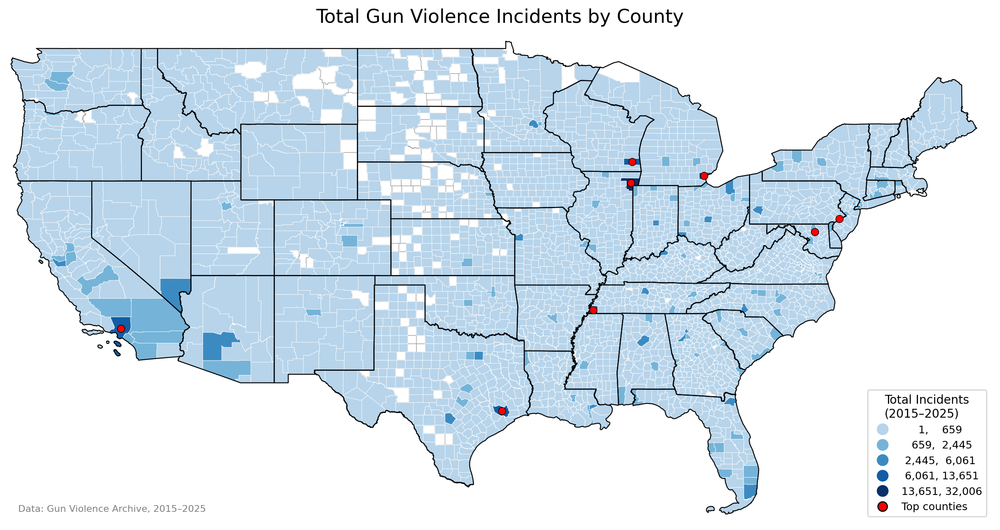

In [22]:
#first map: Total incident rate per county, with zero-count counties in white
# and red dots placed over the few counties in the top 2 categories

top_geo = nonzero_counties[nonzero_counties['FIPS'].isin(top_counties['FIPS'])].copy()
top_geo['centroid'] = top_geo.geometry.centroid

fig, ax = plt.subplots(1, figsize=(15, 10), dpi=200)

zero_counties.plot(ax=ax, color='white', edgecolor='#999999', linewidth=0.4)
nonzero_counties.plot(
    ax=ax, column='Total Incidents', cmap=blues_truncated,
    scheme='natural_breaks', k=5,
    legend=True, edgecolor='white', linewidth=0.3,
    legend_kwds={'title': 'Total Incidents\n(2015–2025)', 'loc': 'lower right', 'fmt': '{:,.0f}'}
)

states.boundary.plot(ax=ax, color='black', linewidth=0.8)

ax.scatter(top_geo['centroid'].x, top_geo['centroid'].y, color='red', s=40, edgecolor='black', linewidth=0.5, zorder=5)

ax.text(0.01, 0.02, 'Data: Gun Violence Archive, 2015–2025', transform=ax.transAxes, fontsize=8, color='gray')

ax.set_xlim(-125, -66)
ax.set_ylim(24, 50)
ax.set_title('Total Gun Violence Incidents by County', fontsize=16)
ax.axis('off')

choropleth_legend = ax.get_legend()
handles = choropleth_legend.legend_handles
labels = [t.get_text() for t in choropleth_legend.get_texts()]
choropleth_legend.remove()

red_dot = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markeredgecolor='black', markersize=8)
handles.append(red_dot)
labels.append('Top counties')

ax.legend(handles=handles, labels=labels, title='Total Incidents\n(2015–2025)', loc='lower right', fontsize=9, frameon=True)

plt.show()

In [15]:
#list of the counties in the darkest two categories that were given a red dot
import mapclassify

classifier = mapclassify.NaturalBreaks(nonzero_counties['Total Incidents'], k=5)
print(classifier.bins)  # shows the 5 breakpoints

threshold = classifier.bins[2]  # top of the 3rd bin = bottom edge of the top 2 bins
top_counties = nonzero_counties[nonzero_counties['Total Incidents'] > threshold][['FIPS', 'NAME', 'Total Incidents']].sort_values('Total Incidents', ascending=False)
top_counties

[  659.  2445.  6061. 13651. 32006.]


,FIPS,NAME,Total Incidents
624,17031,Cook,32006
579,42101,Philadelphia,13651
388,06037,Los Angeles,10481
1280,48201,Harris,9134
179,24510,Baltimore,8509
668,55079,Milwaukee,7461
279,26163,Wayne,6900
2169,47157,Shelby,6685


In [23]:
#change the shades of green because the light green is tooooo light
greens_full = plt.cm.get_cmap('Greens')
greens_truncated = mcolors.LinearSegmentedColormap.from_list(
    'greens_truncated', greens_full(np.linspace(0.3, 1.0, 256))
)

/tmp/ipykernel_849/3905525743.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  greens_full = plt.cm.get_cmap('Greens')


In [24]:
#list of counties in darkest two categories that will be given a red dot
classifier_pc = mapclassify.NaturalBreaks(nonzero_counties['Total Incidents per 100k'], k=5)
print(classifier_pc.bins)

threshold_pc = classifier_pc.bins[2]
top_counties_pc = nonzero_counties[nonzero_counties['Total Incidents per 100k'] > threshold_pc][['FIPS', 'NAME', 'Total Incidents per 100k']].sort_values('Total Incidents per 100k', ascending=False)
top_counties_pc

[  77.18120805  188.20833845  419.82387876  916.10069959 1704.03676661]


,FIPS,NAME,Total Incidents per 100k
3052,29510,St. Louis,1704.036767
2894,22071,Orleans,1578.397748
179,24510,Baltimore,1452.771688
2740,51730,Petersburg,1225.416941
1722,51740,Portsmouth,916.100700
650,51760,Richmond,910.815939
2872,28049,Hinds,910.240535
611,11001,District of Columbia,870.429051
579,42101,Philadelphia,851.167573
1806,22017,Caddo,822.373953


/tmp/ipykernel_849/3870453017.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  top_geo_pc['centroid'] = top_geo_pc.geometry.centroid


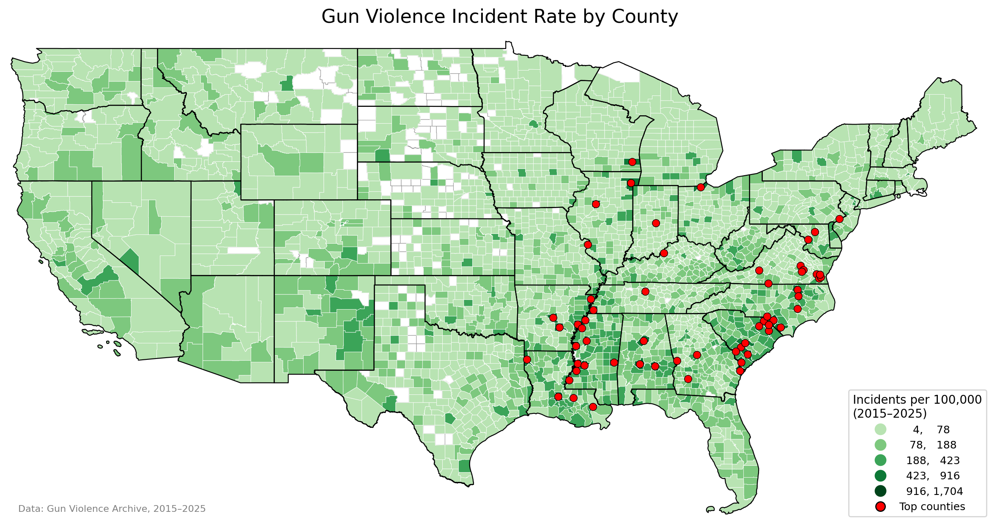

In [25]:
#second map: total incident rate per county, with zero-count counties in white
# and a red dot for counties in the top 2 categories
top_geo_pc = nonzero_counties[nonzero_counties['FIPS'].isin(top_counties_pc['FIPS'])].copy()
top_geo_pc['centroid'] = top_geo_pc.geometry.centroid

fig, ax = plt.subplots(1, figsize=(15, 10), dpi=200)

zero_counties.plot(ax=ax, color='white', edgecolor='#999999', linewidth=0.4)
nonzero_counties.plot(
    ax=ax, column='Total Incidents per 100k', cmap=greens_truncated,
    scheme='natural_breaks', k=5,
    legend=True, edgecolor='white', linewidth=0.3,
    legend_kwds={'title': 'Incidents per 100,000\n(2015–2025)', 'loc': 'lower right', 'fmt': '{:,.0f}'}
)

states.boundary.plot(ax=ax, color='black', linewidth=0.8)

ax.scatter(top_geo_pc['centroid'].x, top_geo_pc['centroid'].y, color='red', s=40, edgecolor='black', linewidth=0.5, zorder=5)

ax.text(0.01, 0.02, 'Data: Gun Violence Archive, 2015–2025', transform=ax.transAxes, fontsize=8, color='gray')

ax.set_xlim(-125, -66)
ax.set_ylim(24, 50)
ax.set_title('Gun Violence Incident Rate by County', fontsize=16)
ax.axis('off')

choropleth_legend = ax.get_legend()
handles = choropleth_legend.legend_handles
labels = [t.get_text() for t in choropleth_legend.get_texts()]
choropleth_legend.remove()

red_dot = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markeredgecolor='black', markersize=8)
handles.append(red_dot)
labels.append('Top counties')

ax.legend(handles=handles, labels=labels, title='Incidents per 100,000\n(2015–2025)', loc='lower right', fontsize=9, frameon=True)

plt.show()

In [26]:
#check that these aren't just tiny counties (AKA statistical noise)
nonzero_counties[nonzero_counties['Total Incidents per 100k'] > 900][['NAME', 'Total Incidents', 'Population_2020', 'Total Incidents per 100k']].sort_values('Total Incidents per 100k', ascending=False)

,NAME,Total Incidents,Population_2020,Total Incidents per 100k
3052,St. Louis,5139,301578,1704.036767
2894,Orleans,6061,383997,1578.397748
179,Baltimore,8509,585708,1452.771688
2740,Petersburg,410,33458,1225.416941
1722,Portsmouth,897,97915,916.100700
650,Richmond,2064,226610,910.815939
2872,Hinds,2073,227742,910.240535


In [31]:
# the next few maps will separate the incident types.
#Accordingly, instead of using the natural breaks, we need to make them all match.

reds_full = plt.cm.get_cmap('Reds')
reds_truncated = mcolors.LinearSegmentedColormap.from_list(
    'reds_truncated', reds_full(np.linspace(0.3, 1.0, 256))
)

type_cols = ['Armed Robbery', 'Domestic Violence', 'Mass Shooting', 'Willful Death', 'Willful Injury']

all_type_values = pd.concat([
    nonzero_counties[nonzero_counties[col] > 0][col] for col in type_cols
])

shared_classifier = mapclassify.NaturalBreaks(all_type_values, k=5)
print(shared_classifier.bins)

[  378.  1458.  3817.  9634. 23388.]


/tmp/ipykernel_849/2009278845.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  reds_full = plt.cm.get_cmap('Reds')


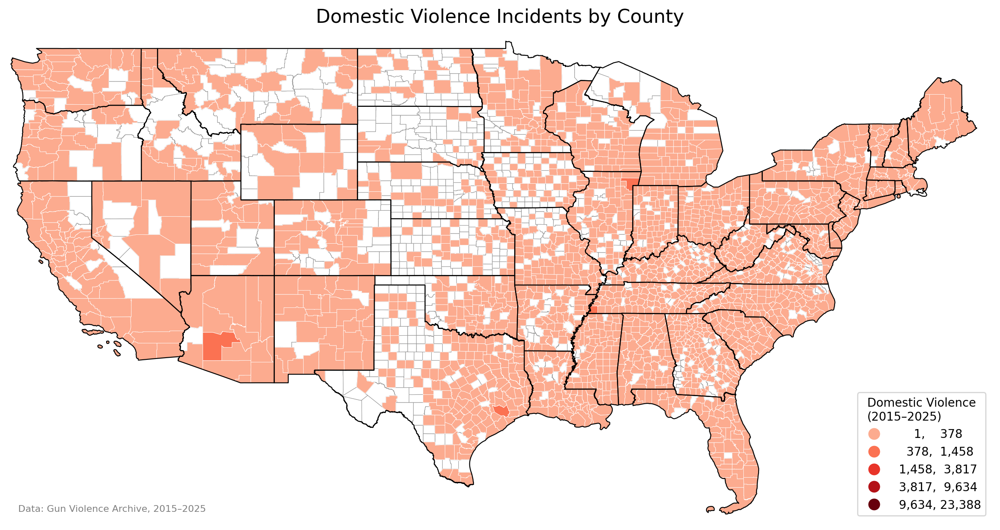

In [32]:
#map 1: Domestic Violence

col = 'Domestic Violence'
zero_this = map_gdf[map_gdf[col] == 0]
nonzero_this = map_gdf[map_gdf[col] > 0]

fig, ax = plt.subplots(1, figsize=(15, 10), dpi=200)

zero_this.plot(ax=ax, color='white', edgecolor='#999999', linewidth=0.4)
nonzero_this.plot(
    ax=ax, column=col, cmap=reds_truncated,
    scheme='user_defined', classification_kwds={'bins': shared_classifier.bins},
    legend=True, edgecolor='white', linewidth=0.3,
    legend_kwds={'title': f'{col}\n(2015–2025)', 'loc': 'lower right', 'fmt': '{:,.0f}'}
)

states.boundary.plot(ax=ax, color='black', linewidth=0.8)

ax.text(0.01, 0.02, 'Data: Gun Violence Archive, 2015–2025', transform=ax.transAxes, fontsize=8, color='gray')

ax.set_xlim(-125, -66)
ax.set_ylim(24, 50)
ax.set_title(f'{col} Incidents by County', fontsize=16)
ax.axis('off')

plt.show()

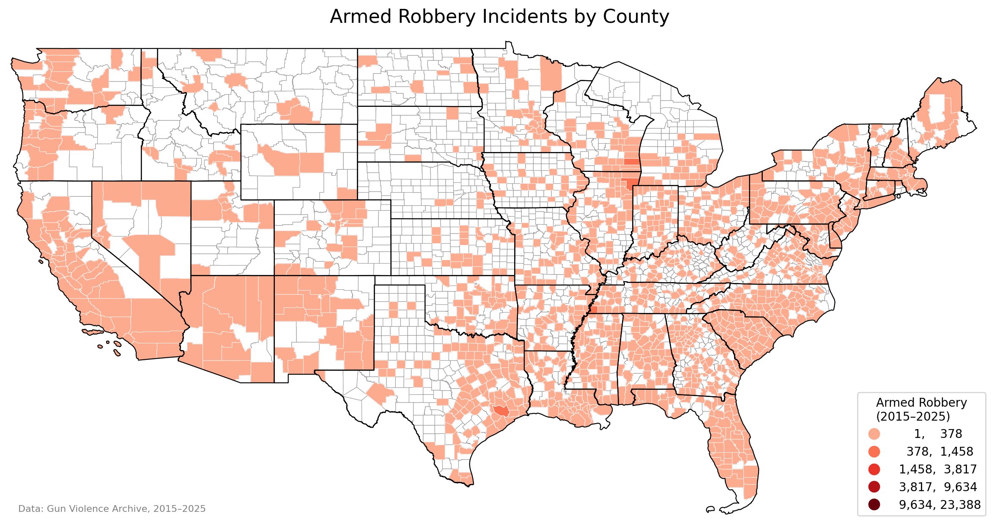

In [34]:
#map 2: Armed Robbery
col = 'Armed Robbery'
zero_this = map_gdf[map_gdf[col] == 0]
nonzero_this = map_gdf[map_gdf[col] > 0]

fig, ax = plt.subplots(1, figsize=(15, 10), dpi=200)

zero_this.plot(ax=ax, color='white', edgecolor='#999999', linewidth=0.4)
nonzero_this.plot(
    ax=ax, column=col, cmap=reds_truncated,
    scheme='user_defined', classification_kwds={'bins': shared_classifier.bins},
    legend=True, edgecolor='white', linewidth=0.3,
    legend_kwds={'title': f'{col}\n(2015–2025)', 'loc': 'lower right', 'fmt': '{:,.0f}'}
)

states.boundary.plot(ax=ax, color='black', linewidth=0.8)

ax.text(0.01, 0.02, 'Data: Gun Violence Archive, 2015–2025', transform=ax.transAxes, fontsize=8, color='gray')

ax.set_xlim(-125, -66)
ax.set_ylim(24, 50)
ax.set_title(f'{col} Incidents by County', fontsize=16)
ax.axis('off')

plt.show()

THIS IS THE LAST THING WE DID SO FAR

## [sep10] join/merge

note! need to specify gdf first (left) and then df (right), otherwhise it doesnt recognize resulting df as gdf but df

awesome power! use it a lot

make it easy on yourself--work smart, not hard! so simplify or subset:
say instead of 200 little indian regions just do 20 big provinces; and instead of 50 convoluted variables, just retain 5<br>

merge may get difficult (especially if difficult data so again simplify): if you need more power:

https://colab.research.google.com/github/theaok/datManPy/blob/main/pandas.ipynb#scrollTo=dMPPOPS92WkA

<br>

 <br>we will cover how to map multiple variables in one map later; for now just use 2 separate maps; and calculate new variables! for instance instead of having 2 maps for crime in 1970 and 2000 just have percent difference: 100*(crim2000-crim1970)/crim1970

<br>
dataset of the week: NJOAG UoF Data:
 https://njoag.app.box.com/s/upgf6yyi9g0fyjg6ednhqmr69dg9crfh

 <br><br>
 map of the week:
 https://maps-dppa.camden.rutgers.edu/index.php?title=Camden_nonprofits

### housing/zillow example

say want to map housing values across nj counties

first get the counties shp (already got it)

now get regular data with housing values and merge with counties shp

and finaly color code the polygons with housing values




#### zillow dat man
(again note can collapse and run all at once)

housing prices for NJ counties (i just googled 'housing prices data') (http://www.zillow.com/research/data):

https://github.com/theaok/data/raw/main/NJ-counties-Zillow-Home-Value-Index-TimeSeries.xls



adjust ID: make counties uppercase (or could drop 'County' from COUNTY LABEL variable)


and clean up:  drop first row if junk in it, excessive columns, \$ \%,\#, etc

code everything so the end product is like:

https://raw.githubusercontent.com/theaok/data/main/all_homes.csv


In [ ]:
zilXls=pd.read_excel('https://github.com/theaok/data/raw/main/NJ-counties-Zillow-Home-Value-Index-TimeSeries.xls')

In [ ]:
zilXls.head(2)

,NJ Zillow Home Value Index - All Homes,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 194,Unnamed: 195,Unnamed: 196,Unnamed: 197,Unnamed: 198,Unnamed: 199,Unnamed: 200,Unnamed: 201,Unnamed: 202,Unnamed: 203
0,Region Name,Region Type,Data Type,1996-04-15 00:00:00,1996-05-15 00:00:00,1996-06-15 00:00:00,1996-07-15 00:00:00,1996-08-15 00:00:00,1996-09-15 00:00:00,1996-10-15 00:00:00,...,2012-03-15 00:00:00,2012-04-15 00:00:00,2012-05-15 00:00:00,2012-06-15 00:00:00,2012-07-15 00:00:00,2012-08-15 00:00:00,2012-09-15 00:00:00,2012-10-15 00:00:00,2012-11-15 00:00:00,2012-12-15 00:00:00
1,New Jersey,state,All Homes,130200,129700,129700,130000,129500,128400,130300,...,256600,257000,257000,257100,256600,256100,256900,258300,259100,259700


In [ ]:
zilXls.dtypes
#zilXls.info(verbose=True)

,0
NJ Zillow Home Value Index - All Homes,object
Unnamed: 1,object
Unnamed: 2,object
Unnamed: 3,object
Unnamed: 4,object
...,...
Unnamed: 199,object
Unnamed: 200,object
Unnamed: 201,object
Unnamed: 202,object


In [ ]:
zilXls1=zilXls[['NJ Zillow Home Value Index - All Homes','Unnamed: 203']]
zilXls1.rename(columns={'NJ Zillow Home Value Index - All Homes': 'county'}, inplace=True)
zilXls1.rename(columns={'Unnamed: 203': 'dec2012'}, inplace=True)
zilXls1

/tmp/ipykernel_580/598143840.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zilXls1.rename(columns={'NJ Zillow Home Value Index - All Homes': 'county'}, inplace=True)
/tmp/ipykernel_580/598143840.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zilXls1.rename(columns={'Unnamed: 203': 'dec2012'}, inplace=True)


,county,dec2012
0,Region Name,2012-12-15 00:00:00
1,New Jersey,259700
2,Atlantic,185800
3,Bergen,380000
4,Burlington,197800
5,Camden,149400
6,Cape May,313600
7,Cumberland,120100
8,Essex,282800
9,Gloucester,175900


In [ ]:
zilXls2=zilXls1.iloc[1:, :] #drop first obs
zilXls2 #note missing val for Morris; always think abt missing data!

,county,dec2012
1,New Jersey,259700
2,Atlantic,185800
3,Bergen,380000
4,Burlington,197800
5,Camden,149400
6,Cape May,313600
7,Cumberland,120100
8,Essex,282800
9,Gloucester,175900
10,Hudson,293100


In [ ]:
zilXls2['COUNTY']=zilXls2['county'].str.upper()
zil1=zilXls2
zil1

/tmp/ipykernel_580/4130304316.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zilXls2['COUNTY']=zilXls2['county'].str.upper()


,county,dec2012,COUNTY
1,New Jersey,259700,NEW JERSEY
2,Atlantic,185800,ATLANTIC
3,Bergen,380000,BERGEN
4,Burlington,197800,BURLINGTON
5,Camden,149400,CAMDEN
6,Cape May,313600,CAPE MAY
7,Cumberland,120100,CUMBERLAND
8,Essex,282800,ESSEX
9,Gloucester,175900,GLOUCESTER
10,Hudson,293100,HUDSON


In [ ]:
#obsolete (was loading cleaned up already data without cleaning in py)
#!wget -q -O zillow.csv  https://docs.google.com/uc?id=1Q4tCZT0EfaJP_WGwKcxuPaQ_dDFonW4E&export=download
#!wget -q -O zil0.csv https://raw.githubusercontent.com/theaok/data/main/all_homes.csv
#zil0=pd.read_csv('zil0.csv')
#zil0.head(3)
#zil1=zil0[['UPPER','Dec 2012']]
#zil1.rename(columns={'UPPER': 'COUNTY'}, inplace=True) #fix col names to match 1st dataset
#zil1 #note missing val for Morris; always think abt missing data!

#### zillow merge and map

In [ ]:
#merge
njC1 = pd.merge(njC, zil1, on='COUNTY',how='outer',indicator=True) #(make sure to have njC shapefile from previous sec)
njC1[['COUNTY','dec2012','POPDEN2010','_merge']] #all good, NEW JERSEY expected not to merge
#!!!always inwestigate the merge result and always briefly explain it!!!

,COUNTY,dec2012,POPDEN2010,_merge
0,ATLANTIC,185800,450.0,both
1,BERGEN,380000,3774.0,both
2,BURLINGTON,197800,547.0,both
3,CAMDEN,149400,2257.0,both
4,CAPE MAY,313600,340.0,both
5,CUMBERLAND,120100,313.0,both
6,ESSEX,282800,6044.0,both
7,GLOUCESTER,175900,857.0,both
8,HUDSON,293100,12309.0,both
9,HUNTERDON,327000,293.0,both


In [ ]:
njC2 = pd.merge(njC, zil1, on='COUNTY',how='inner',indicator=False) #so do 'inner' that will only keep the exact matches

<Axes: >

[]

[]

Text(0.5, 80.7222222222222, 'source/definition: zillow.com/research/data')

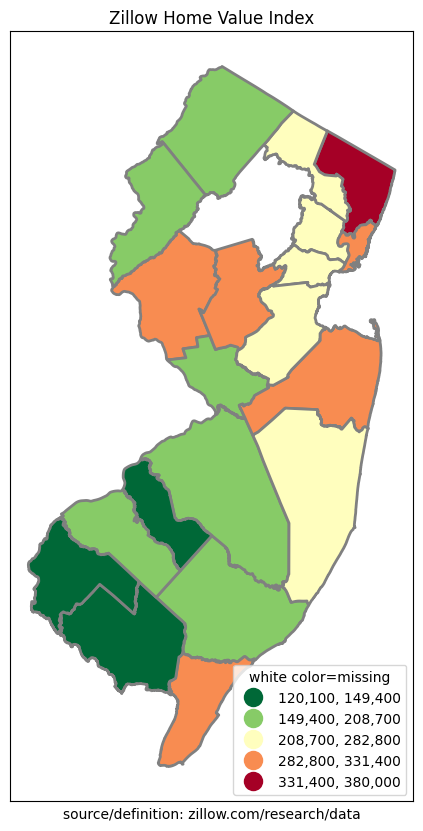

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC2.plot(ax=ax,column='dec2012',legend=True,cmap='RdYlGn_r',
          scheme='natural_breaks',k=5, edgecolor='grey',linewidth=2,
          legend_kwds= {"fmt": "{:,.0f}",'loc':'lower right','markerscale':1.4})
leg1 = ax.get_legend()
leg1.set_title('''white color=missing''')
ax.title.set_text("Zillow Home Value Index")
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks
ax.set_xlabel('''source/definition: zillow.com/research/data''')
#plt.savefig('fig.pdf',bbox_inches='tight') #,pad_inches=0.1, dpi=200, transparent=True #eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff
#files.download('fig.pdf') #note can also right click fig and save image as

###  abortions example

In [ ]:
#as of sep2025 this download doesnt work anymore--one reason to always save original data!!! datasets do change and go down

# get data: https://data.guttmacher.org/ has a nice API
# can click thru to get the table we want, which results in url (can open in webbrowser):
# https://data.guttmacher.org/counties/table?county=34001+34003+34005+34007+34009+34011+34013+34015+34017+34019+34021+34023+34025+34027+34029+34031+34033+34035+34037+34039+34041&topics=244+247&dataset=data&state=NJ
# and then can right click on 'download xls' (csv is messy in this case) button under the table and 'copy link address' and paste into wget (need quotes!):
#!wget -q -O njAb0.xls  "https://data.guttmacher.org/download?locationType=county&visualization=datatable&topic=244+247&locations=34001+34003+34005+34007+34009+34011+34013+34015+34017+34019+34021+34023+34025+34027+34029+34031+34033+34035+34037+34039+34041&measures=424+425+426+427+428+429+436+437+438+439+440+441+442&totalKey=NJ"

# alternatively can scrap the table
#import requests
#url = 'https://data.guttmacher.org/counties/table?county=34001+34003+34005+34007+34009+34011+34013+34015+34017+34019+34021+34023+34025+34027+34029+34031+34033+34035+34037+34039+34041&topics=244+247&dataset=data&state=NJ'
#header = {
#  "User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.75 Safari/537.36",
#  "X-Requested-With": "XMLHttpRequest"
#}
#r = requests.get(url, headers=header)
#pd.read_html(r.text,match='U.S. County',flavor=None)[0].head(3) #for match just putting name of first col

#njAb0=pd.read_excel('njAb0.xls')
#njAb0.head(3)
#njAb0.columns
#njAb=njAb0[['U.S. County','Total publicly funded clinics, 2015 [1]']] #keep it simple

In [ ]:
njAb=pd.read_csv('https://raw.githubusercontent.com/theaok/data/refs/heads/main/abortions.csv')
njAb.rename(columns={'COUNTY': 'U.S. County'}, inplace=True)
njAb.head(3)

,U.S. County,"Total publicly funded clinics, 2015 [1]"
0,ATLANTIC,6
1,BERGEN,6
2,BURLINGTON,4


In [ ]:
#look at shapefile cnty names
njC.COUNTY_LAB #(make sure to have njC shapefile from previous sec)

,COUNTY_LAB
0,Atlantic County
1,Bergen County
2,Burlington County
3,Camden County
4,Cape May County
5,Cumberland County
6,Essex County
7,Gloucester County
8,Hudson County
9,Hunterdon County


In [ ]:
njC['U.S. County']=njC['COUNTY_LAB'].str.replace(' County','') #get rid of ' County' [note space in front of county]
njC['U.S. County']=njC['U.S. County'].str.upper() #make uppercase
njC['U.S. County'].head(3)

/usr/local/lib/python3.13/dist-packages/geopandas/geodataframe.py:1969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,U.S. County
0,ATLANTIC
1,BERGEN
2,BURLINGTON


In [ ]:
njCAb = pd.merge(njC, njAb, on='U.S. County',how='outer',indicator=True)
njCAb[['COUNTY','Total publicly funded clinics, 2015 [1]','_merge']].head(50) # ok
#njCAb = pd.merge(njC, njAb, on='U.S. County',how='inner',indicator=True) #inner merge
#njCAb

,COUNTY,"Total publicly funded clinics, 2015 [1]",_merge
0,ATLANTIC,6,both
1,BERGEN,6,both
2,BURLINGTON,4,both
3,CAMDEN,10,both
4,CAPE MAY,4,both
5,CUMBERLAND,6,both
6,ESSEX,15,both
7,GLOUCESTER,3,both
8,HUDSON,14,both
9,HUNTERDON,1,both


In [ ]:
njCAb.dtypes

,0
COUNTY,object
COUNTY_LAB,object
POP2010,int64
POPDEN2010,int64
geometry,geometry
U.S. County,object
"Total publicly funded clinics, 2015 [1]",int64
_merge,category


In [ ]:
#often (not here) need to convert string (object) to numeric (float or int; float is safer can have decimals if needed)
njCAb['publicly funded clinics, 2015'] = njCAb['Total publicly funded clinics, 2015 [1]'].astype(float)

In [ ]:
njCAb[['U.S. County','Total publicly funded clinics, 2015 [1]','publicly funded clinics, 2015']]

,U.S. County,"Total publicly funded clinics, 2015 [1]","publicly funded clinics, 2015"
0,ATLANTIC,6,6.0
1,BERGEN,6,6.0
2,BURLINGTON,4,4.0
3,CAMDEN,10,10.0
4,CAPE MAY,4,4.0
5,CUMBERLAND,6,6.0
6,ESSEX,15,15.0
7,GLOUCESTER,3,3.0
8,HUDSON,14,14.0
9,HUNTERDON,1,1.0


<Axes: >

Text(0.5, 1.0, 'count of publicly funded abortion clinics, 2015')

Text(0.5, 0.1, 'data from guttmacher.org\n            Publicly Funded Contraceptive Services at U.S. Clinics, 2015, Frost JJ, et al., 2017')

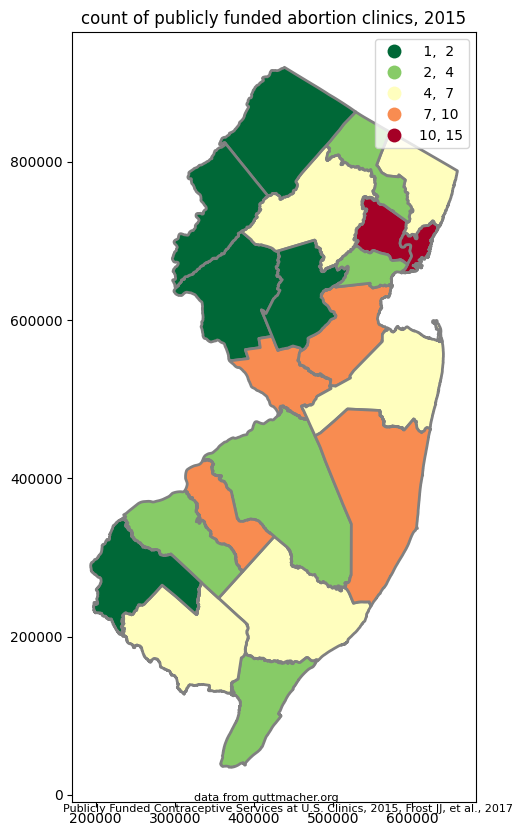

In [ ]:
#same thing as always, nothing new here!
fig, ax = plt.subplots(figsize=(6,10))

njCAb.plot(ax=ax,figsize=(10,12),column='publicly funded clinics, 2015',legend=True,cmap='RdYlGn_r',
          scheme='natural_breaks',k=5, edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}"})
#ax.set_xticks([]) #kills xticks
#ax.set_yticks([]) #kills xticks
ax.set_title('count of publicly funded abortion clinics, 2015')
#ax.annotate('Note added to chart with minimum parameters', xy = (200000, 1000))
plt.figtext(0.5, 0.1,
            '''data from guttmacher.org
            Publicly Funded Contraceptive Services at U.S. Clinics, 2015, Frost JJ, et al., 2017''',
            ha="center", fontsize=8, #bbox={"facecolor":"white", "alpha":0.5, "pad":5}
            )

### [sep17] us census data example

census is a great source of data, even at neigh lev!

for neigh lev (census tracts)  want 5-yr ACS (so that the standard errors on estimates for these tiny areas are not too huge)

https://geomap.ffiec.gov/FFIECGeocMap/GeocodeMap1.aspx (borders do change from one year to another)
<br><br>

https://data.census.gov/cedsci/advanced SKIP (instead do user-friendly socialexplorer below):



Geography: Tract: New Jersey: Camden County: All Census Tracts within Camden County

note: selection appears in the left panel

Topics: Income and Poverty: Poverty: Official Poverty Measure

Years: 2015

Search

click ``POVERTY STATUS IN THE PAST 12 MONTHS''  (ACS2011-2015 S1701)

(take note of margins of errors)

sure can transpose and download as csv but its a mess!




https://www.socialexplorer.com/data-library (free on-campus or vpn)

one rule to guide us is to be lazy/work smart, not hard

so use an alternative to clunky/messy census

Tables: ACS 2015-2019: Begin Report

140 Census Tracts: New Jersey: Camden County: All

SE:A13003B. Poverty Status in 2019 for Population Age 18 to 64

downloaded as csv and reposted:
https://raw.githubusercontent.com/theaok/data/main/R13437109_SL140.csv



In [ ]:
!wget -q -O pov0.csv https://raw.githubusercontent.com/theaok/data/main/R13437109_SL140.csv

pov0=pd.read_csv('pov0.csv')
pov0.head(3)

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_US,...,Geo_PCI,Geo_TAZ,Geo_UGA,Geo_BTTR,Geo_BTBG,Geo_PUMA5,Geo_PUMA1,SE_A13003B_001,SE_A13003B_002,SE_A13003B_003
0,34007600200,14000US34007600200,Census Tract 6002,"Census Tract 6002, Camden County, New Jersey",nj,140,0,ACSSF,1761,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1398,405,993
1,34007600400,14000US34007600400,Census Tract 6004,"Census Tract 6004, Camden County, New Jersey",nj,140,0,ACSSF,1762,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1793,725,1068
2,34007600700,14000US34007600700,Census Tract 6007,"Census Tract 6007, Camden County, New Jersey",nj,140,0,ACSSF,1763,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,847,394,453


In [ ]:
#as per the above documentation we see percent poor is
#number of poor people divided by population: SE_A13003B_002/SE_A13003B_001
pov0['pov']=(pov0.SE_A13003B_002/pov0.SE_A13003B_001)*100
pov=pov0[['pov','Geo_NAME']]
pov

,pov,Geo_NAME
0,28.969957,Census Tract 6002
1,40.435025,Census Tract 6004
2,46.517119,Census Tract 6007
3,41.643929,Census Tract 6008
4,47.969656,Census Tract 6009
...,...,...
122,6.073211,Census Tract 6113
123,5.392517,Census Tract 6114
124,5.954142,Census Tract 6115
125,16.037063,Census Tract 6116


get geo data; often can't find the data covering only what you want (say 1 county), then get it for larger area (all of nj) and subset/slice)

https://www.census.gov/geo/maps-data/data/tiger-line.html

Download-Web Interface: 2019: Census Tracts: New Jersey

reposted:
https://github.com/theaok/data/raw/main/tl_2019_34_tract.zip

In [ ]:
! wget -q -O tracts.zip https://github.com/theaok/data/raw/main/tl_2019_34_tract.zip
zip_ref = zipfile.ZipFile('tracts.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
#! ls
tracts=gpd.read_file('tl_2019_34_tract.shp')

<Axes: >

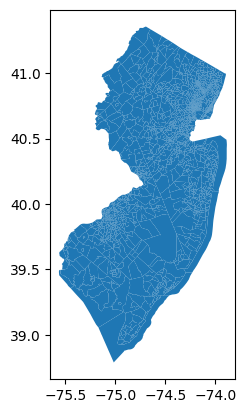

In [ ]:
#%%capture
tracts.plot() #humongous, thousands of tracts!

In [ ]:
tracts.dtypes

,0
STATEFP,object
COUNTYFP,object
TRACTCE,object
GEOID,object
NAME,object
NAMELSAD,object
MTFCC,object
FUNCSTAT,object
ALAND,int64
AWATER,int64


In [ ]:
tracts.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC',
       'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry'],
      dtype='object')

In [ ]:
tracts[['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC',
       'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON']].head(5)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON
0,34,031,256804,34031256804,2568.04,Census Tract 2568.04,G5020,S,29792621,809082,+41.0787934,-074.3779531
1,34,031,246300,34031246300,2463,Census Tract 2463,G5020,S,10100083,480508,+40.9104210,-074.2642143
2,34,031,181200,34031181200,1812,Census Tract 1812,G5020,S,401624,0,+40.9242986,-074.1499553
3,34,031,256803,34031256803,2568.03,Census Tract 2568.03,G5020,S,14231776,740595,+41.1221009,-074.3805752
4,34,031,246003,34031246003,2460.03,Census Tract 2460.03,G5020,S,6580967,1795588,+40.9770103,-074.2610348


In [ ]:
print(tracts.geometry[0])

POLYGON ((-74.415909 41.088612999999995, -74.414836 41.089960999999995, -74.414453 41.09046, -74.414211 41.090754, -74.414041 41.090948999999995, -74.413871 41.091128999999995, -74.413355 41.091632, -74.412129 41.09278, -74.411458 41.093412, -74.40978799999999 41.094986, -74.40964799999999 41.095141999999996, -74.40940599999999 41.095441, -74.409317 41.095566999999996, -74.409072 41.095949, -74.408885 41.09625, -74.408329 41.097176, -74.40747999999999 41.098555999999995, -74.407439 41.098625, -74.40714799999999 41.099077, -74.40703599999999 41.09923, -74.40682699999999 41.099547, -74.406492 41.100023, -74.40612399999999 41.100581, -74.405952 41.100834, -74.405627 41.101344999999995, -74.405518 41.101516, -74.405307 41.101867999999996, -74.405011 41.102346, -74.404581 41.103068, -74.404455 41.103277999999996, -74.40432799999999 41.103476, -74.40422199999999 41.103629999999995, -74.404127 41.10375, -74.40395199999999 41.103941999999996, -74.403594 41.104285999999995, -74.40341599999999 4

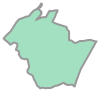

In [ ]:
tracts.geometry[0] #note geometries: x/y or lat/lon

In [ ]:
tracts["COUNTYFP"].value_counts(dropna=False)

,count
COUNTYFP,
013,210
003,179
023,175
017,166
025,144
007,127
029,126
005,114
039,108


google county codes:

https://www.google.com/search?client=firefox-b-1-d&q=nj+counties+fips+codes

https://en.wikipedia.org/wiki/List_of_counties_in_New_Jersey

<Axes: >

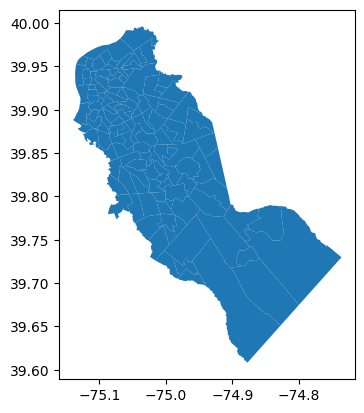

In [ ]:
tractsCam=tracts[tracts.COUNTYFP=='007']
tractsCam.plot() #yay

In [ ]:
tractsCam.NAMELSAD

,NAMELSAD
174,Census Tract 6071
175,Census Tract 6072
176,Census Tract 6073
177,Census Tract 6074.01
212,Census Tract 6004
...,...
1860,Census Tract 6060
1861,Census Tract 6010
1862,Census Tract 6092.05
1863,Census Tract 6082.09


In [ ]:
a1 = pd.merge(tractsCam, pov, left_on='NAMELSAD', right_on='Geo_NAME',how='outer',indicator=True)

In [ ]:
a1['_merge'].value_counts() #yay

,count
_merge,
both,127
left_only,0
right_only,0


<Axes: >

[]

[]

Text(0.5, 80.7222222222222, 'source/var def: socialexplorer.com/tables/ACS2019_5yr/R13437109')

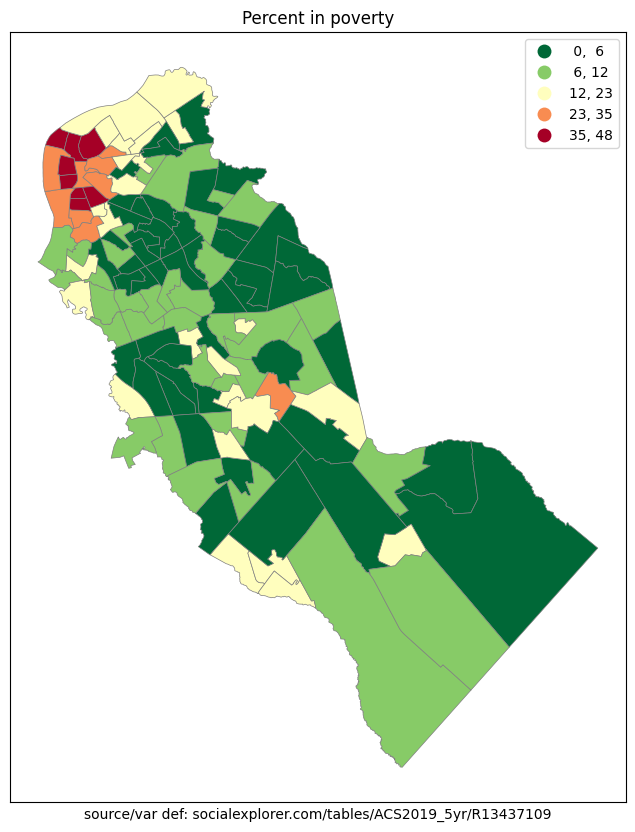

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
a1.plot(ax=ax,column='pov',legend=True,cmap='RdYlGn_r',
          scheme='natural_breaks',k=5, edgecolor='grey',linewidth=.5,legend_kwds= {"fmt": "{:,.0f}"})
ax.title.set_text("Percent in poverty")
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks
ax.set_xlabel('''source/var def: socialexplorer.com/tables/ACS2019_5yr/R13437109''')

#interpret as always

### Camden block gr clip ex
https://colab.research.google.com/drive/1OkxSonnQ41OkJqBcNJ8-_8y8Jn1BxW0W?usp=sharing

## <font color='red'> \>will be updated from here\> </font>

# [oct1] bells n' whistles (geoprocessing)

we did basic easy mapping, but there's more to it

everyone needs schemes (classification), and the rest just pick what's useful for you!


### schemes (classification)

elaboration and details:
https://geographicdata.science/book/notebooks/05_choropleth.html

(['boxplot', 'equalinterval', 'fisherjenks', 'fisherjenkssampled', 'headtailbreaks', 'jenkscaspall', 'jenkscaspallforced', 'jenkscaspallsampled', 'maxp', 'maximumbreaks', 'naturalbreaks', 'quantiles', 'percentiles', 'prettybreaks', 'stdmean', 'userdefined'])

<Axes: >

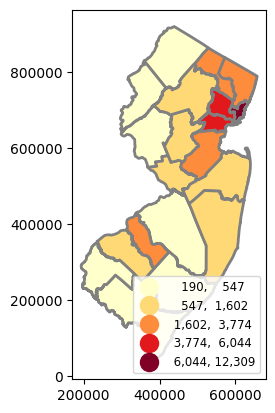

In [ ]:
njC.plot(column='POPDEN2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

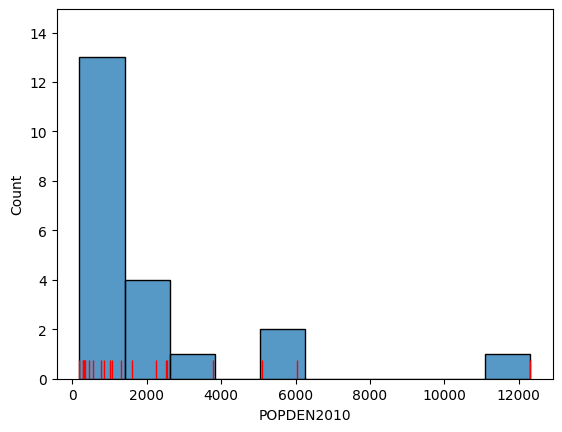

In [ ]:
#do think how distribution translate into colors!!
#njC.POPDEN2010.hist(bins=10) #super skewed!
ax = sns.histplot(njC["POPDEN2010"], bins=10)
sns.rugplot(njC["POPDEN2010"], height=0.05, color="red", ax=ax);

<Axes: >

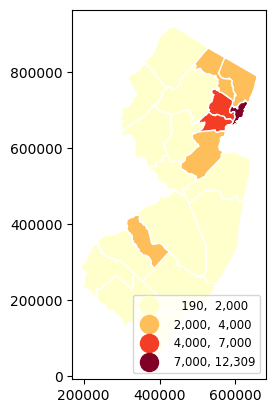

In [ ]:
#your own classification: 2k looks like good cutoff, then 4k and 7k
njC.plot(column="POPDEN2010", scheme="user_defined", cmap="YlOrRd", classification_kwds={'bins':[2000, 4000, 7000]},
         linewidth=1,edgecolor='white', legend=True,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})


,POPDEN2010
14,190
16,279
9,293
18,300
5,313
4,340
0,450
2,547
12,761
7,857


<Axes: >

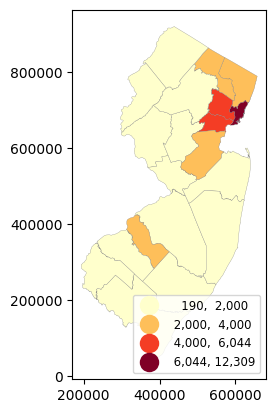

In [ ]:
njC.POPDEN2010.sort_values()
#note the bin is upto val with it; and next one is from it without it
njC.plot(column="POPDEN2010", scheme="user_defined", cmap="YlOrRd", classification_kwds={'bins':[2000, 4000, 6044]},
         linewidth=.2,edgecolor='grey', legend=True,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

### simplify geo

In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp')
njC=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','geometry']]

In [ ]:
njC.dtypes

,0
COUNTY,object
COUNTY_LAB,object
POP2010,int64
POPDEN2010,int64
geometry,geometry


<Axes: >

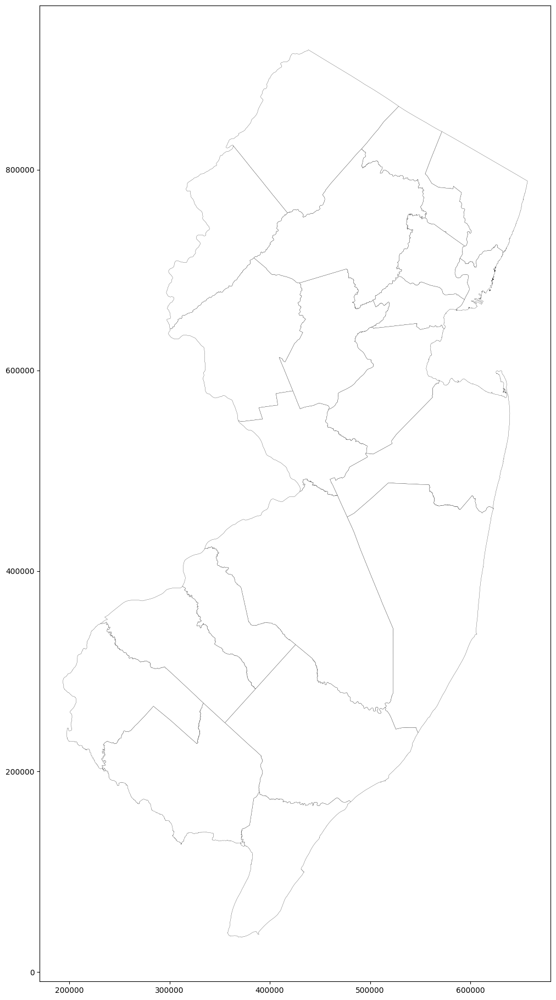

In [ ]:
njC.plot(figsize=(12,24), color='white', edgecolor='black',linewidth=.2)

<Axes: >

-rw-r--r-- 1 root root  37K Oct  3 13:09 njC1.kml
-rw-r--r-- 1 root root 6.5M Oct  3 13:09 njC.kml


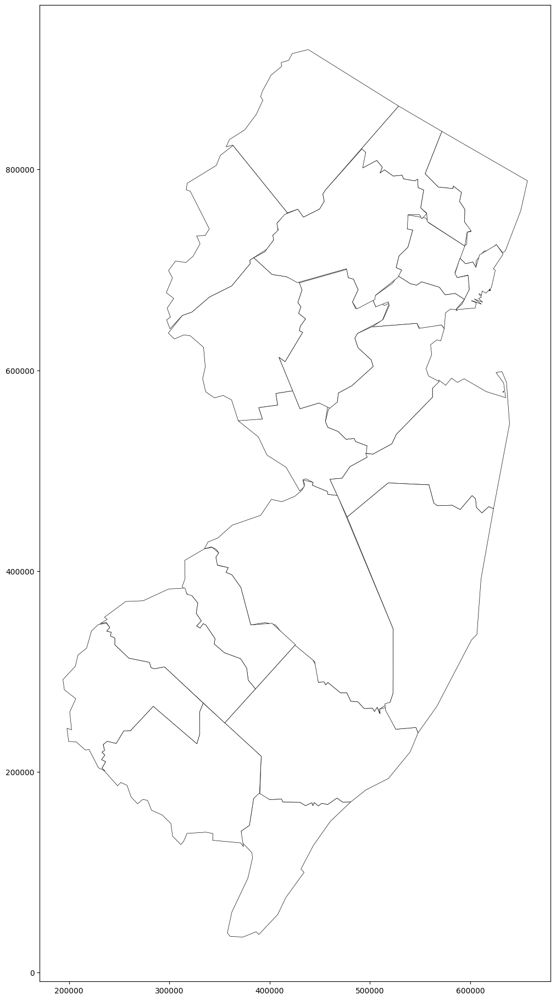

In [ ]:
njC1=njC.copy()
njC1['geometry'] = njC1.simplify(tolerance=2000)
njC1.plot(figsize=(12,24), color='white', edgecolor='black',linewidth=.5)
njC.to_file('njC.kml', driver='KML')
njC1.to_file('njC1.kml', driver='KML')
! ls -lah *.kml #37k v 6.5m!!!

In [ ]:
#TODO checkout new
#gdf.simplify_coverage(tolerance=10)


### I/O
(in gpd < 1 was fiona, now pyogrio (both gdal wrappers); btw command line ogr2ogr super powerfull)

gdal is the library for i/o!!!!

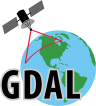

In [ ]:
#%%capture
#!pip install fiona

In [ ]:
#import fiona
# bunch of available drivers are unexposed but supported (depends on the GDAL-build)
# https://github.com/Toblerity/Fiona/blob/main/fiona/drvsupport.py
# https://gdal.org/en/stable/drivers/vector/index.html
# can activate these on runtime by updating the supported_drivers dictionary:
# fiona.supported_drivers["NAS"] = "raw"
#fiona.supported_drivers['KML'] = 'rw'
#fiona.supported_drivers

In [ ]:
import pyogrio; pyogrio.list_drivers()

{'PCIDSK': 'rw',
 'PDS4': 'rw',
 'VICAR': 'rw',
 'PDF': 'rw',
 'MBTiles': 'rw',
 'EEDA': 'r',
 'OGCAPI': 'r',
 'ESRI Shapefile': 'rw',
 'MapInfo File': 'rw',
 'UK .NTF': 'r',
 'LVBAG': 'r',
 'OGR_SDTS': 'r',
 'S57': 'rw',
 'DGN': 'rw',
 'OGR_VRT': 'r',
 'Memory': 'rw',
 'CSV': 'rw',
 'GML': 'rw',
 'GPX': 'rw',
 'KML': 'rw',
 'GeoJSON': 'rw',
 'GeoJSONSeq': 'rw',
 'ESRIJSON': 'r',
 'TopoJSON': 'r',
 'OGR_GMT': 'rw',
 'GPKG': 'rw',
 'SQLite': 'rw',
 'WAsP': 'rw',
 'OpenFileGDB': 'rw',
 'DXF': 'rw',
 'FlatGeobuf': 'rw',
 'Geoconcept': 'rw',
 'GeoRSS': 'rw',
 'VFK': 'r',
 'PGDUMP': 'rw',
 'OSM': 'r',
 'GPSBabel': 'rw',
 'OGR_PDS': 'r',
 'WFS': 'r',
 'OAPIF': 'r',
 'EDIGEO': 'r',
 'SVG': 'r',
 'Idrisi': 'r',
 'ODS': 'rw',
 'XLSX': 'rw',
 'Elasticsearch': 'rw',
 'Carto': 'rw',
 'AmigoCloud': 'rw',
 'SXF': 'r',
 'Selafin': 'rw',
 'JML': 'rw',
 'PLSCENES': 'r',
 'CSW': 'r',
 'VDV': 'rw',
 'MVT': 'rw',
 'NGW': 'rw',
 'MapML': 'rw',
 'GTFS': 'r',
 'PMTiles': 'rw',
 'JSONFG': 'rw',
 'MiraMonVecto

In [ ]:
!wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp')
njC01=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','geometry']]

njC=njC01.copy()
njC['geometry'] = njC.simplify(tolerance=2000) #simplify geo (sec above)--important for online mapping
#njC.plot(figsize=(6,12), color='white', edgecolor='black',linewidth=1)

In [ ]:
njC.to_file('njC.kml', driver='KML')
!head -25 njC.kml #go to:
#https://www.google.com/maps/d/
#hit create new map and hit Import under layers at top right

<?xml version="1.0" encoding="utf-8" ?>
<kml xmlns="http://www.opengis.net/kml/2.2">
<Document id="root_doc">
<Schema name="njC" id="njC">
	<SimpleField name="COUNTY" type="string"></SimpleField>
	<SimpleField name="COUNTY_LAB" type="string"></SimpleField>
	<SimpleField name="POP2010" type="string"></SimpleField>
	<SimpleField name="POPDEN2010" type="string"></SimpleField>
</Schema>
<Folder><name>njC</name>
  <Placemark id="njC.1">
	<name>ATLANTIC</name>
	<description>Atlantic County</description>
	<Style><LineStyle><color>ff0000ff</color></LineStyle><PolyStyle><fill>0</fill></PolyStyle></Style>
	<ExtendedData><SchemaData schemaUrl="#njC">
		<SimpleData name="COUNTY">274549</SimpleData>
		<SimpleData name="COUNTY_LAB">450</SimpleData>
	</SchemaData></ExtendedData>
      <Polygon><outerBoundaryIs><LinearRing><coordinates>-74.674372333837,39.688575837676 -74.6597869843215,39.6678047783428 -74.6548013434801,39.6268460343075 -74.6341527050818,39.6280730548772 -74.628717844307,39.6200946604

In [ ]:
njC.to_file('njC.geojson', driver='GeoJSON')
!head -10 njC.geojson #coords in weird format

{
"type": "FeatureCollection",
"name": "njC",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:EPSG::3424" } },
"features": [
{ "type": "Feature", "properties": { "COUNTY": "ATLANTIC", "COUNTY_LAB": "Atlantic County", "POP2010": 274549, "POPDEN2010": 450 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 443056.010060578584671, 311529.76988223940134 ], [ 447146.910015244036913, 303956.689884074032307 ], [ 448524.590002663433552, 289035.919856905937195 ], [ 454341.030141413211823, 289473.480005405843258 ], [ 455867.590080413967371, 286565.300126239657402 ], [ 458036.980098579078913, 288964.859959654510021 ], [ 470526.100133411586285, 278718.309914737939835 ], [ 476937.160145912319422, 278644.359931401908398 ], [ 480934.649854328483343, 270112.790052324533463 ], [ 487955.419933494180441, 269751.630013488233089 ], [ 494083.929986163973808, 263058.710000403225422 ], [ 502557.720125161111355, 263358.520096324384212 ], [ 504506.640111830085516, 260017.610111489892006 ]

<Axes: >

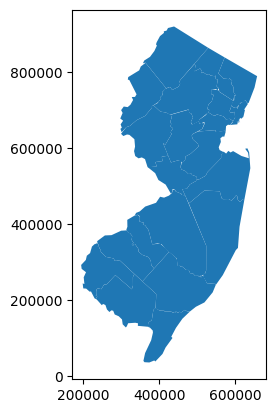

In [ ]:
a=gpd.read_file('njC.geojson')
a.plot() #works fine in gpd

In [ ]:
with open('test.geojson', 'w') as f:
    f.write(njC.to_json(to_wgs84=True))
!head test.geojson #proper coordinates now :)

34896

{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {"COUNTY": "ATLANTIC", "COUNTY_LAB": "Atlantic County", "POP2010": 274549, "POPDEN2010": 450}, "geometry": {"type": "Polygon", "coordinates": [[[-74.67437233383701, 39.68857583767599], [-74.65978698432146, 39.667804778342834], [-74.65480134348013, 39.62684603430755], [-74.63415270508177, 39.6280730548772], [-74.62871784430699, 39.62009466047849], [-74.62102776040155, 39.62669103058673], [-74.57665479765272, 39.598596339071094], [-74.55390171009437, 39.59840608774667], [-74.5397012356475, 39.57498782365419], [-74.51479266834865, 39.57400207302361], [-74.49305202100206, 39.5556268863461], [-74.46299654876402, 39.55644435619163], [-74.45608977699081, 39.54726920980147], [-74.44650946221375, 39.5590071407023], [-74.43750000713119, 39.54119765103669], [-74.43802029348575, 39.55382835677089], [-74.41754424326376, 39.55735463165842], [-74.38079627108975, 39.498536853134375], [-74.30950883546215, 39.5032735

In [ ]:
import folium as f #https://colab.research.google.com/github/theaok/gisPy/blob/main/folium.ipynb
map = f.Map()
f.GeoJson('test.geojson').add_to(map)
map

In [ ]:
#TODO checkout new
#Fast I/O (pyogrio): Support for engine="pyogrio" in read_file for significantly faster reading/writing of GIS files.

### geocoding

geocode=turn street address into coords

https://automating-gis-processes.github.io/CSC/notebooks/L3/Geocoding_in_Geopandas.html

In [ ]:
df=pd.read_csv('https://github.com/theaok/data/raw/main/addresses.txt',sep=';')
df=df[0:5]
df

,id,addr
0,1000,"Itämerenkatu 14, 00101 Helsinki, Finland"
1,1001,"Kampinkuja 1, 00100 Helsinki, Finland"
2,1002,"Kaivokatu 8, 00101 Helsinki, Finland"
3,1003,"Hermannin rantatie 1, 00580 Helsinki, Finland"
4,1005,"Tyynenmerenkatu 9, 00220 Helsinki, Finland"


In [ ]:
from geopandas.tools import geocode

In [ ]:
#change adam to your name
geo = geocode(df['addr'], provider='nominatim', user_agent='adam',timeout=2)
geo.head(2)

,geometry,address
0,POINT (24.91556 60.1632),"Ruoholahti, 14, Itämerenkatu, Ruoholahti, Läns..."
1,POINT (24.93166 60.16905),"Kamppi, 1, Kampinkuja, Kamppi, Eteläinen suurp..."


<Axes: >

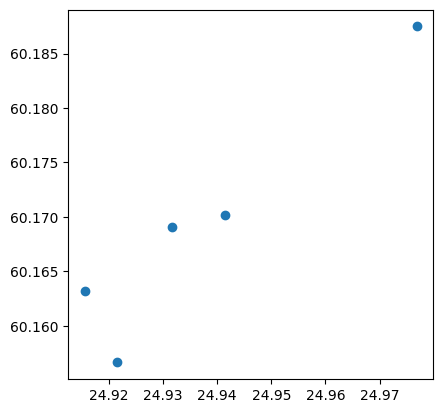

In [ ]:
geo.plot()

### map x y ( lat lon)

https://geopandas.org/en/stable/gallery/create_geopandas_from_pandas.html

In [ ]:
df = pd.DataFrame(
    {
        "City": ["Buenos Aires", "Brasilia", "Santiago", "Bogota", "Caracas"],
        "Country": ["Argentina", "Brazil", "Chile", "Colombia", "Venezuela"],
        "Latitude": [-34.58, -15.78, -33.45, 4.60, 10.48],
        "Longitude": [-58.66, -47.91, -70.66, -74.08, -66.86],
    }
)
df

,City,Country,Latitude,Longitude
0,Buenos Aires,Argentina,-34.58,-58.66
1,Brasilia,Brazil,-15.78,-47.91
2,Santiago,Chile,-33.45,-70.66
3,Bogota,Colombia,4.60,-74.08
4,Caracas,Venezuela,10.48,-66.86


In [ ]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude) #, crs="EPSG:4326"
)
#note the projection, may try with or without it: crs;
#if things map like in ocean or antarctica, email listserv

<Axes: >

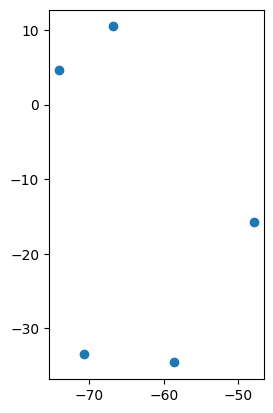

In [ ]:
gdf.plot()

###  subset shapefile

super duper popular actually--often much more easier to get data at larger area, eg good luck finding atlantic county munis, but can easily get nj munis, then just subset to atlantic; or indeed can make your own shapefile, eg there's no shapefile for south jersey, but you can make one from new jersey

In [ ]:
!wget -q -O us.zip https://github.com/theaok/data/raw/main/cb_2018_us_state_500k.zip
zip_ref = zipfile.ZipFile('us.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping

<Axes: >

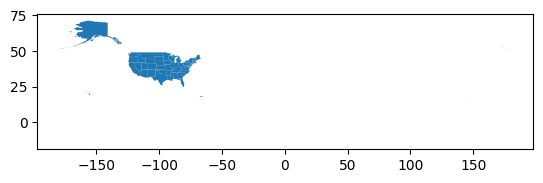

In [ ]:
us=gpd.read_file('cb_2018_us_state_500k.shp')
us.plot()

<Axes: >

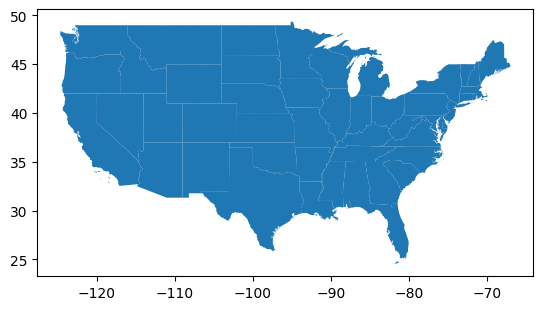

In [ ]:
cont = us[~us['NAME'].isin(['Alaska', 'Hawaii', 'Puerto Rico','American Samoa','United States Virgin Islands','Guam','Commonwealth of the Northern Mariana Islands'])]
cont.plot()

or just google for what you want; even possibly with inset :)

https://www.google.com/search?client=firefox-b-1-d&q=uss+hapefile+alaska+perto+rico+inset

or as now other formats are becoming more popular use kml or GeoPackage:

https://www.google.com/search?client=firefox-b-1-d&q=coniguous+us+states+kml


### aggregate data: groupby+agg

make sure stuff matches 1:1, not 1:many, eg when you merge uni to counties, thats many:1, many uni per 1 county, need to aggregate first to a summary stats like sum!

In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC

In [ ]:
!wget -q -O col.zip  https://docs.google.com/uc?id=1bb9KES6QDE7cleE4L38yQ7939LlXUHB5&export=download
zip_ref = zipfile.ZipFile('col.zip', 'r');zip_ref.extractall(); zip_ref.close()

col0 = gpd.read_file('2007_11_30_NJ_COLL_UNIV_njsp.shp')
col0.dtypes
col0.head(3)

,0
ID,object
METLNKID,object
FEATTYPE,object
SECCLASS,object
NAME,object
AREA,object
PHONE,object
ADDRESS,object
ADDRESS2,object
CITY,object


,ID,METLNKID,FEATTYPE,SECCLASS,NAME,AREA,PHONE,ADDRESS,ADDRESS2,CITY,...,X,Y,ST_VENDOR,ST_VERSION,GEOPREC,PHONELOC,QC_QA,DEGREE,ENROLL,geometry
0,10273936,None,POINT,UNCLASSIFIED,RAMAPO COLLEGE OF NEW JERSEY,201,684-7500,505 RAMAPO VALLEY RD,None,MAHWAH,...,-74.177826,41.082642,NAVTEQ,2006Q4,BLOCKFACE,None,None,MASTER'S DEGREE,5538,POINT (580936.143 819465.262)
1,10273934,None,POINT,UNCLASSIFIED,NEW BRUNSWICK THEOLOGICAL SEMINARY,732,247-5241,17 SEMINARY PL,None,NEW BRUNSWICK,...,-74.448814,40.501346,NAVTEQ,2006Q4,BLOCKFACE,None,None,DOCTOR'S DEGREE,203,POINT (506358.894 607539.257)
2,10273932,None,POINT,UNCLASSIFIED,MONMOUTH UNIVERSITY,732,571-3400,400 CEDAR AVE,None,WEST LONG BRANCH,...,-74.003765,40.281505,NAVTEQ,2006Q4,BLOCKFACE,None,None,POST-MASTER'S CERTIFICATE,6351,POINT (630565.964 527840.459)


In [ ]:
col=col0[['COUNTY','NAME','ENROLL']]
#col
col.ENROLL=col.ENROLL.astype(float)
col.sort_values(by='COUNTY',inplace=True)
col

/tmp/ipython-input-4072875663.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.ENROLL=col.ENROLL.astype(float)
/tmp/ipython-input-4072875663.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.sort_values(by='COUNTY',inplace=True)


,COUNTY,NAME,ENROLL
36,ATLANTIC,ATLANTIC CAPE COMMUNITY COLLEGE,6845.0
25,ATLANTIC,THE RICHARD STOCKTON COLLEGE OF NEW JERSEY,7035.0
0,BERGEN,RAMAPO COLLEGE OF NEW JERSEY,5538.0
33,BERGEN,FAIRLEIGH DICKINSON UNIVERSITY - METROPOLITAN ...,8237.0
37,BERGEN,BERGEN COMMUNITY COLLEGE,14762.0
...,...,...,...
62,SUSSEX,SUSSEX COUNTY COMMUNITY COLLEGE,3461.0
13,UNION,UNION COUNTY COLLEGE,10976.0
47,UNION,KEAN UNIVERSITY,12958.0
14,WARREN,CENTENARY COLLEGE,2460.0


In [ ]:
colAgg=col.groupby('COUNTY').agg('sum')
colAgg
6845+7035==13880  #double check from previous table

#then can merge and map :)

,NAME,ENROLL
COUNTY,,
ATLANTIC,ATLANTIC CAPE COMMUNITY COLLEGETHE RICHARD STO...,13880.0
BERGEN,RAMAPO COLLEGE OF NEW JERSEYFAIRLEIGH DICKINSO...,30343.0
BURLINGTON,BURLINGTON COUNTY COLLEGE,7888.0
CAMDEN,UNIVERSITY OF MEDICINE AND DENTISTRY OF NEW JE...,20058.0
CUMBERLAND,CUMBERLAND COUNTY COLLEGE,3260.0
ESSEX,ESSEX COUNTY COLLEGENEW JERSEY INSTITUTE OF TE...,65569.0
GLOUCESTER,ROWAN UNIVERSITYGLOUCESTER COUNTY COLLEGE,15784.0
HUDSON,SAINT PETERS COLLEGESTEVENS INSTITUTE OF TECHN...,22915.0
MERCER,THE COLLEGE OF NEW JERSEYRIDER UNIVERSITYPRINC...,39979.0


True

### standardize and finer resolution

<b>standardize</b> cant compare apple to oranges, divide by area or population, eg wind turbines per sq km; crime per 100k

<b>finer resolution</b>
remember maup problem from slides? ie phenomena (crime, wind turbines, etc) are not evenly distributed across space, so say you have county and you color code it for some level of crime or wind turbines and it makes it look as if it is all uniform across county, but it isnt! map at finer resolution! do municiplaities, or even neighborhoods; or actual points where crime happened or wind turbine sits

In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC
njC=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','SQ_MILES','geometry']]

<Axes: >

[]

[]

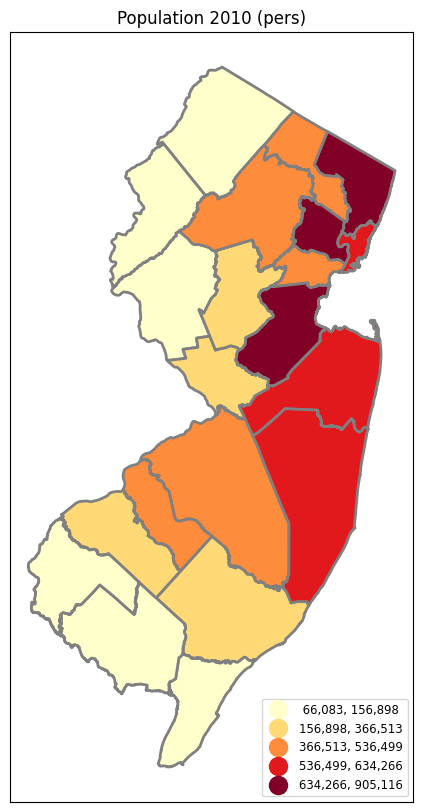

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
ax.title.set_text("Population 2010 (pers)")
ax.set_xticks([]); ax.set_yticks([])

In [ ]:
njC['popDen10']=njC.POP2010/njC.SQ_MILES

/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

[]

[]

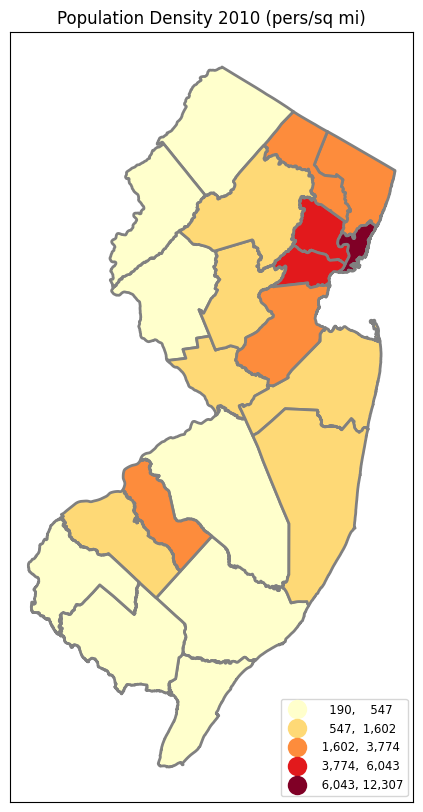

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='popDen10',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
ax.title.set_text("Population Density 2010 (pers/sq mi)")
ax.set_xticks([]); ax.set_yticks([])

In [ ]:
njM0=gpd.read_file('nj_munis.shp')
njM=njM0[['COUNTY','POP2010','POPDEN2010','SQ_MILES','geometry']]

<Axes: >

[]

[]

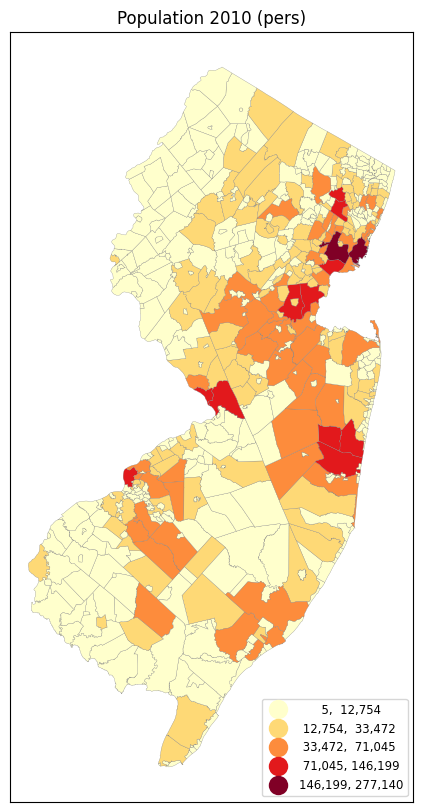

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njM.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
ax.title.set_text("Population 2010 (pers)")
ax.set_xticks([]); ax.set_yticks([])

### side-by-side and overlay

helpful all the time; usually want to have some side-by-sides for comparison

almost always do overlays! that's bread and butter of mapping; just be clean dont clutter

<Axes: >

[]

[]

<Axes: >

[]

[]

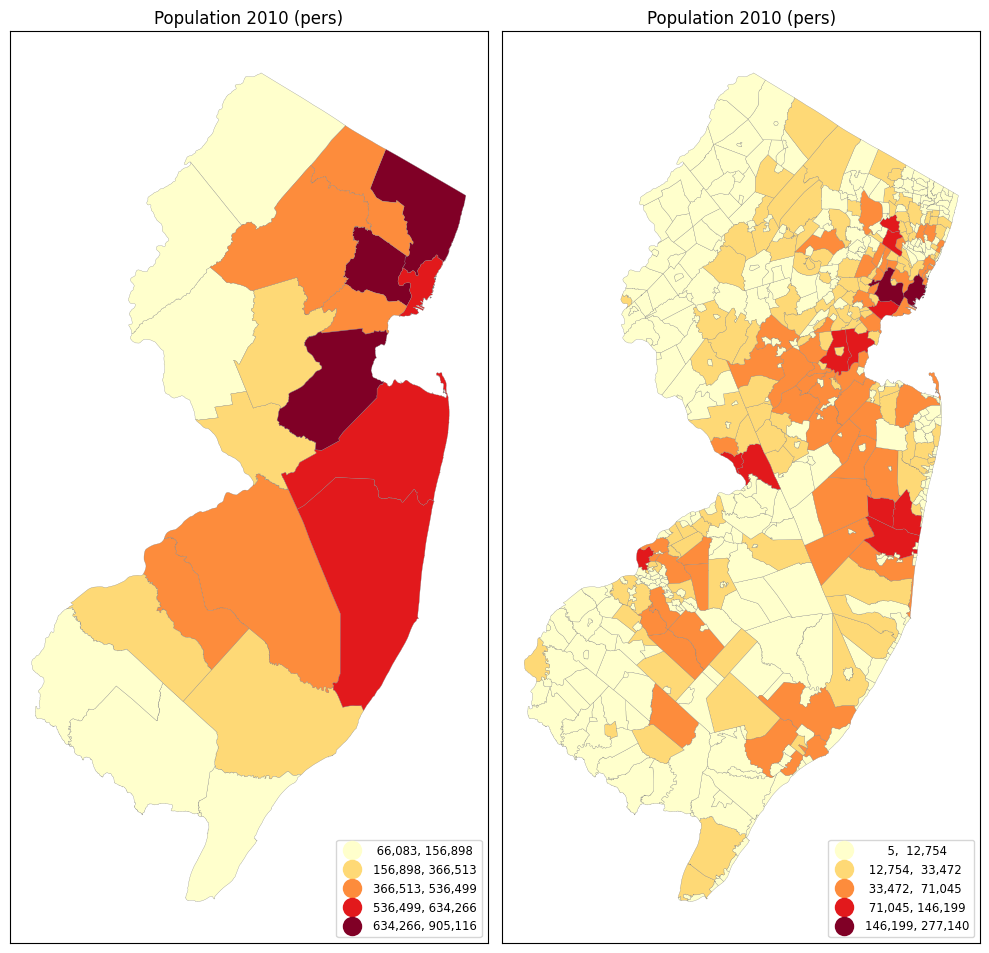

In [ ]:
#side-by-side: subplots 1row,2col; then just axs[0] and axs[1]
fig, axs = plt.subplots(1,2, figsize=(10,10),sharey=True, tight_layout=True)
njC.plot(ax=axs[0],column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
axs[0].title.set_text("Population 2010 (pers)")
axs[0].set_xticks([]); axs[0].set_yticks([])

njM.plot(ax=axs[1],column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
axs[1].title.set_text("Population 2010 (pers)")
axs[1].set_xticks([]); axs[1].set_yticks([])

<Axes: >

<Axes: >

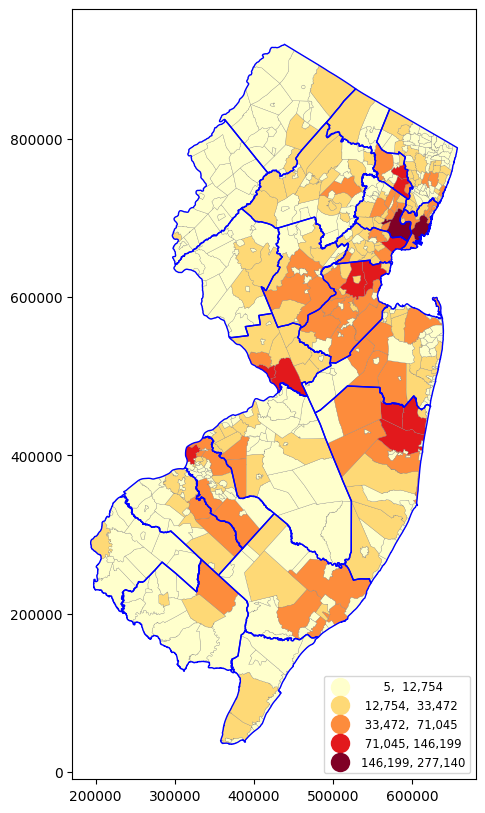

In [ ]:
#overlay: just keep adding on the same ax
fig, ax = plt.subplots(1, figsize=(6,10))
njM.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})
njC.plot(ax=ax,edgecolor='blue',linewidth=1, facecolor="none") #alpha=0.1)

to overlay 2 thematic polygon layers, probably cleanest to just have 2 cat eg yes/no for the overlay, or maybe max 3 cat say lo, med, and hi



In [ ]:
njC.COUNTY #say we want to overlay camden and cumberland

,COUNTY
0,ATLANTIC
1,BERGEN
2,BURLINGTON
3,CAMDEN
4,CAPE MAY
5,CUMBERLAND
6,ESSEX
7,GLOUCESTER
8,HUDSON
9,HUNTERDON


In [ ]:
#first, subset to some interesting area, and then overlay that
njC_cam_cum=njC.query("COUNTY=='CAMDEN' | COUNTY=='CUMBERLAND'")

<>:12: SyntaxWarning: invalid escape sequence '\ '
<>:12: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipython-input-3071767670.py:12: SyntaxWarning: invalid escape sequence '\ '
  \   - back diagonal


<Axes: >

<Axes: >

'\n/   - diagonal hatching\n\\   - back diagonal\n|   - vertical\n-   - horizontal\n+   - crossed\nx   - crossed diagonal\no   - small circle\nO   - large circle\n.   - dots\n*   - stars\n'

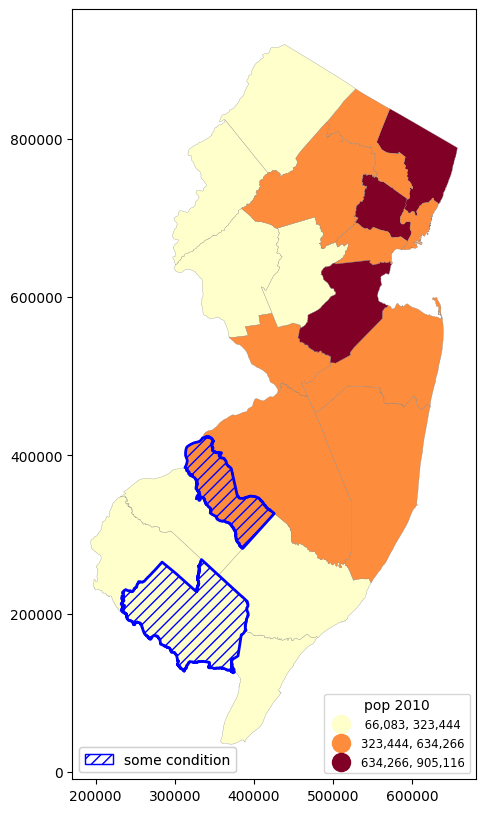

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=3,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

#just like subset and hash or dot
#njC_cam_cum.plot(ax=ax,edgecolor='blue',linewidth=2, facecolor="none",alpha=1)
#njC_cam_cum.plot(ax=ax,edgecolor='blue',linewidth=2, facecolor="none",alpha=1,hatch='/')
njC_cam_cum.plot(ax=ax,edgecolor='blue',linewidth=2, facecolor="none",alpha=1,hatch='///')
'''
/   - diagonal hatching
\   - back diagonal
|   - vertical
-   - horizontal
+   - crossed
x   - crossed diagonal
o   - small circle
O   - large circle
.   - dots
*   - stars
'''

l1 = ax.get_legend()
l1.set_title('''pop 2010''')

import matplotlib.patches as mpatches

bluePatch = mpatches.Patch(edgecolor='blue', facecolor='none',
                     hatch='///', label=r'some condition')

l2=plt.legend(handles=[bluePatch],loc='lower left')

ax.add_artist(l2)
ax.add_artist(l1)


#njC.plot(ax=ax,edgecolor='blue',linewidth=1, facecolor="none") #alpha=0.1)

<Axes: >

<Axes: >

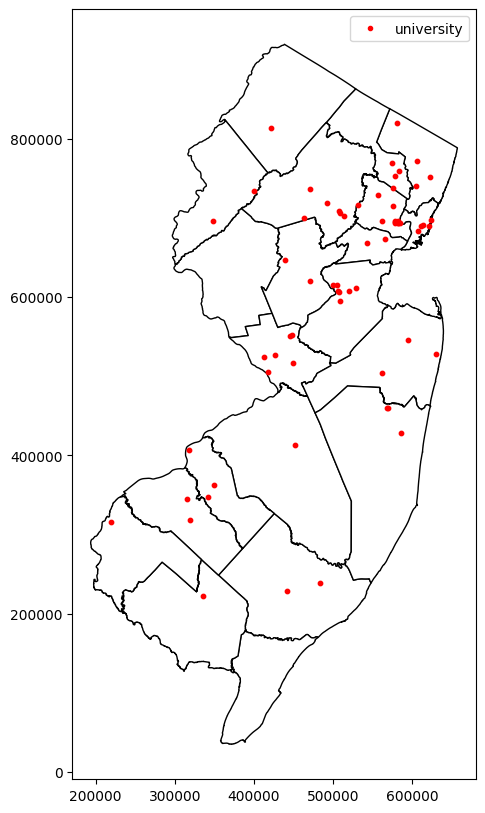

In [ ]:
#overlay with points, same as earlier under sec: dive into...
!wget -q -O col.zip  https://docs.google.com/uc?id=1bb9KES6QDE7cleE4L38yQ7939LlXUHB5&export=download
zip_ref = zipfile.ZipFile('col.zip', 'r');zip_ref.extractall(); zip_ref.close()

col = gpd.read_file('2007_11_30_NJ_COLL_UNIV_njsp.shp')

#overlay: just use plot fn twice
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax, color='white', edgecolor='black',linewidth=1)
col.plot(ax=ax, marker='o', color='red', markersize=10,legend=True)
#col.plot(column='enr',markersize=50,legend=True,cmap='RdYlGn_r',scheme='QUANTILES',k=5,ax=ax)
#ax.set_title('Watersheds by area ($mi^2$)')

#custom legend
#https://stackoverflow.com/questions/39500265/how-to-manually-create-a-legend
#import matplotlib.patches as mpatches
#red_patch = mpatches.Patch(color='red', label='The red data')
from matplotlib.lines import Line2D
point = Line2D([0], [0], label='university', marker='o', markersize=3,
         markeredgecolor='r', markerfacecolor='r', linestyle='')
plt.legend(handles=[point])

<Axes: >

<Axes: >

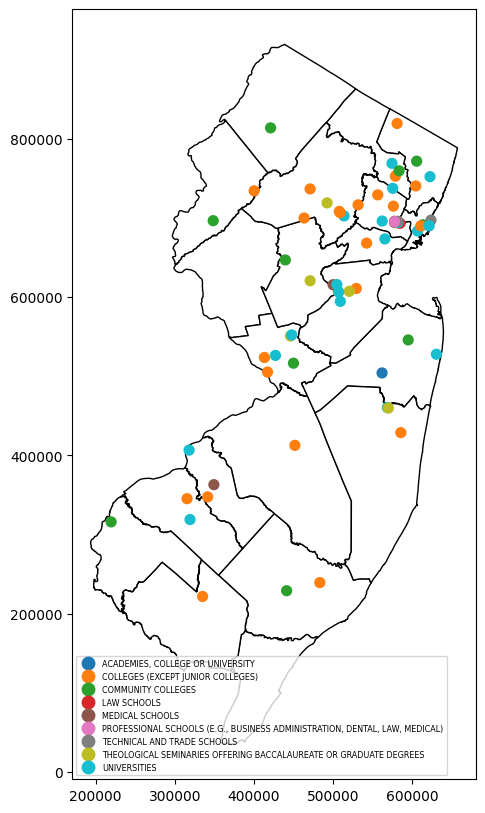

In [ ]:
#from pandas.core.interchange.dataframe_protocol import Column
!wget -q -O col.zip  https://docs.google.com/uc?id=1bb9KES6QDE7cleE4L38yQ7939LlXUHB5&export=download
zip_ref = zipfile.ZipFile('col.zip', 'r');zip_ref.extractall(); zip_ref.close()

col = gpd.read_file('2007_11_30_NJ_COLL_UNIV_njsp.shp')

#overlay: just use plot fn twice
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax, color='white', edgecolor='black',linewidth=1)
col.plot(ax=ax, marker='o',markersize=50,legend=True,column='NAICSDESCR',
         legend_kwds= {
        'loc':'lower left','title_fontsize':'medium','fontsize':'xx-small','markerscale':1.0})
#ok first stab, but too cluttered; group into like say max 5 cats

#### add to canvas anything: turn anything into img eg pd styler

not really necessary unless you are bored

In [ ]:
%%capture
!pip install imgkit
!sudo apt-get install wkhtmltopdf
import imgkit

In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC

njC=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','geometry']]


In [ ]:
njCs = njC[['COUNTY','POP2010']].sort_values(by='POP2010', ascending=False)
sty = njCs.style.background_gradient(cmap='YlOrRd')
sty

,COUNTY,POP2010
1,BERGEN,905116
20,MIDDLESEX,809858
6,ESSEX,783969
8,HUDSON,634266
11,MONMOUTH,630380
12,OCEAN,576567
17,UNION,536499
3,CAMDEN,513657
13,PASSAIC,501226
19,MORRIS,492276


QStandardPaths: XDG_RUNTIME_DIR not set, defaulting to '/tmp/runtime-root'
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


True

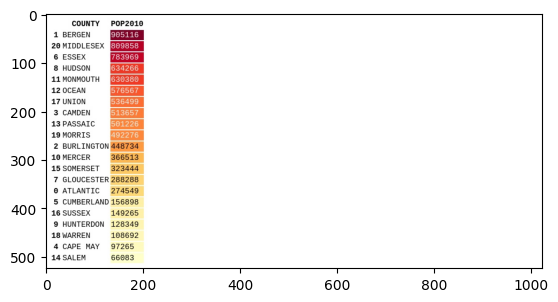

In [ ]:
imgkit.from_string(sty.to_html(), 'sty.jpg')

import matplotlib.image as mpimg
img = mpimg.imread('sty.jpg')
plt.imshow(img)

<Axes: >

[]

[]

[]

[]

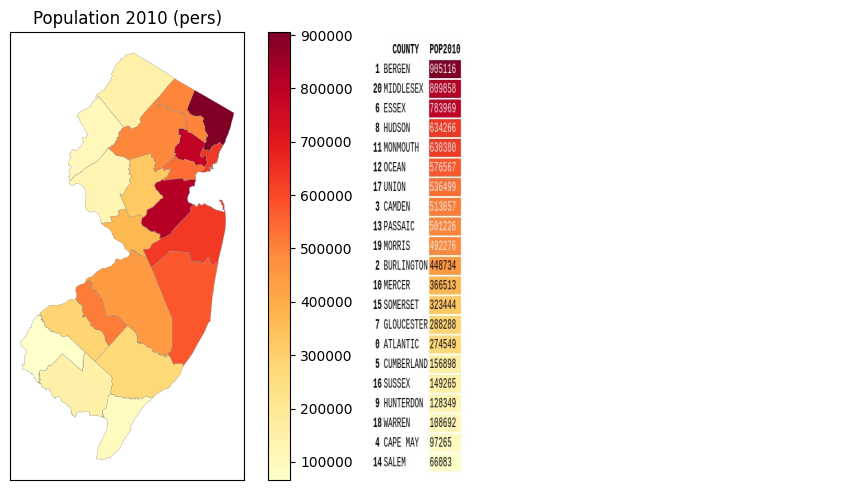

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,5),tight_layout=True)
njC.plot(ax=axs[0],column='POP2010',legend=True,cmap='YlOrRd',#scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,
         #legend_kwds= {"fmt": "{:,.0f}", 'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}
         ) #
axs[0].title.set_text("Population 2010 (pers)")
axs[0].set_xticks([]); axs[0].set_yticks([])

axs[1].imshow(img,aspect='auto') #,  extent=[0,1,0,1]  aspect=3.5
axs[1].set_axis_off()
axs[1].set_xticks([]); axs[1].set_yticks([])

### centroids thematic maps

In [ ]:
njP = njC.copy()

njP["geometry"] = njP["geometry"].centroid

In [ ]:
njP.head(3)

,COUNTY,COUNTY_LAB,POP2010,POPDEN2010,geometry
0,ATLANTIC,Atlantic County,274549,450,POINT (446845.671 234718.679)
1,BERGEN,Bergen County,905116,3774,POINT (608674.972 775344.901)
2,BURLINGTON,Burlington County,448734,547,POINT (445015.1 380378.991)


<Axes: >

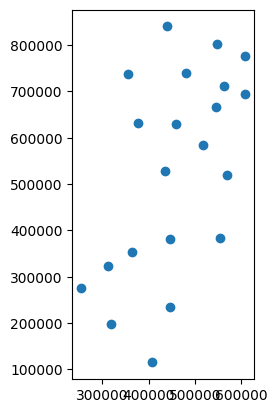

In [ ]:
njP.plot()

<Axes: >

[]

[]

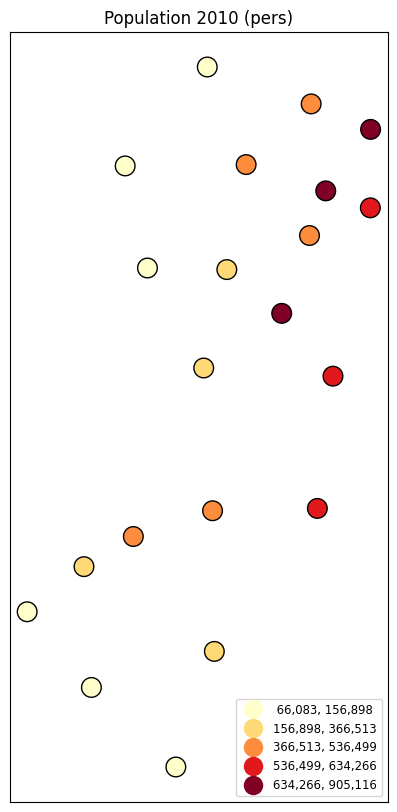

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njP.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='black',linewidth=1,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4},
         markersize = 200) #
ax.title.set_text("Population 2010 (pers)")
ax.set_xticks([]); ax.set_yticks([])

<Axes: >

<Axes: >

[]

[]

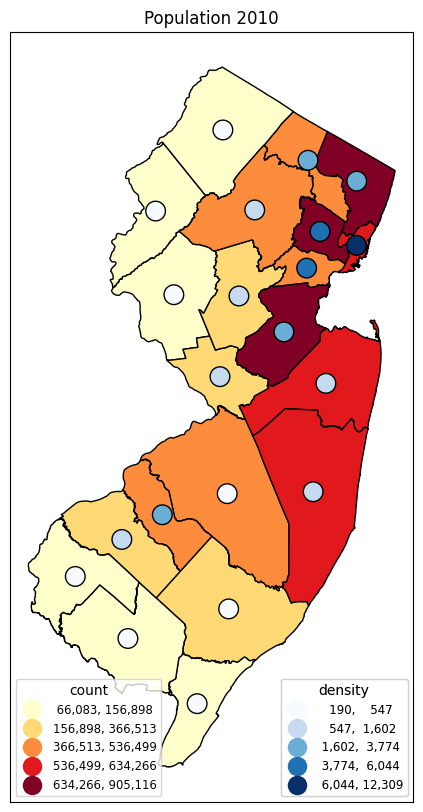

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='black',linewidth=1,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower left','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

l1 = ax.get_legend()
l1.set_title('''count''')

njP.plot(ax=ax,column='POPDEN2010',legend=True,cmap='Blues',scheme='natural_breaks',k=5,
         edgecolor='black',linewidth=1,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4},
         markersize = 200) #

ax.title.set_text("Population 2010")
ax.set_xticks([]); ax.set_yticks([])

l2 = ax.get_legend()
l2.set_title('''density''')



ax.add_artist(l2)
ax.add_artist(l1)

### edgecolors

fancy! artistic!

<Axes: >

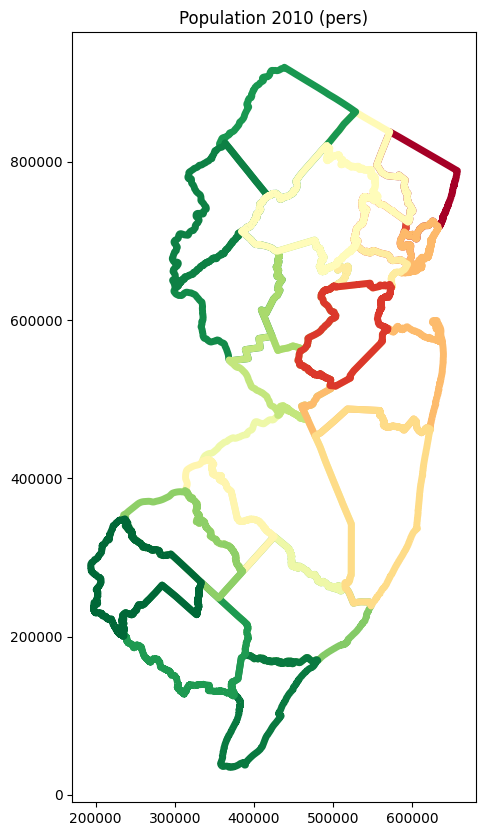

In [ ]:
#https://colab.research.google.com/github/hbeck118/GIS/blob/main/ps3_final.ipynb#scrollTo=Vlg-X8y1_pQW&line=21&uniqifier=1
#TODO get legend working as in above reference
import matplotlib.colors as mcolors

#TODO: simplify
norm = mcolors.Normalize(vmin=njC['POP2010'].min(),
                         vmax=njC['POP2010'].max())
edgecolors = plt.cm.RdYlGn_r(norm(njC['POP2010'].values))

fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,edgecolor=edgecolors,alpha=1, linewidth=5, facecolor="none") #
ax.title.set_text("Population 2010 (pers)")
#the limitation is edges overlap,and having them transparent doesnt help much;
#but can see the other color a tincy bit around the line

### annotate

yes! want to do pretty much always with your final map, does help with storytelling

Text(446845.6710119825, 234718.67854471222, 'ATLANTIC')

Text(608674.9722903798, 775344.9010704905, 'BERGEN')

Text(445015.10017129, 380378.9908087645, 'BURLINGTON')

Text(362977.140254135, 353705.812773536, 'CAMDEN')

Text(407013.1101691078, 114992.23820242906, 'CAPE MAY')

Text(319542.7506195572, 197359.46040186452, 'CUMBERLAND')

Text(562253.4894992855, 711675.2449585614, 'ESSEX')

Text(311851.0044582621, 322497.09146205307, 'GLOUCESTER')

Text(608428.8356149012, 694107.9908801537, 'HUDSON')

Text(377593.6983420124, 631791.0280015195, 'HUNTERDON')

Text(435852.78759398806, 528228.3056099586, 'MERCER')

Text(569736.7056196635, 519774.2489392377, 'MONMOUTH')

Text(553566.9451515801, 382793.6503082437, 'OCEAN')

Text(547142.4144700206, 801720.2266180195, 'PASSAIC')

Text(253014.767951469, 275761.56707926694, 'SALEM')

Text(459788.98517990607, 630164.5125108969, 'SOMERSET')

Text(439541.23874521523, 839964.6338105244, 'SUSSEX')

Text(545391.2858900087, 665430.0582508749, 'UNION')

Text(354515.98946147866, 737506.369618912, 'WARREN')

Text(479789.7234039994, 738913.4075906109, 'MORRIS')

Text(516625.77448488685, 584830.6357102671, 'MIDDLESEX')

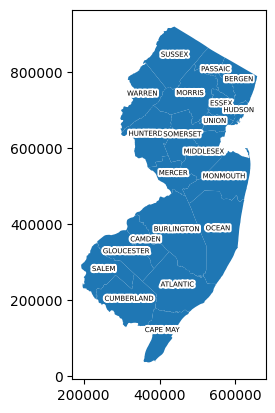

In [ ]:
#u/a labels: basic and useful thing to do
from matplotlib.patheffects import withStroke
ax=njC.plot() #https://stackoverflow.com/questions/38899190/geopandas-label-polygons
for x, y, label in zip(njP.geometry.x, njP.geometry.y, njP.COUNTY):
    ax.annotate(label, xy=(x, y),horizontalalignment='center',
    fontsize=5,color='black', #fontweight='bold',
    path_effects=[withStroke(linewidth=3, foreground='white')]) #ytext=(3, 3), textcoords="offset points"

<Axes: >

Text(400000, 800000, 'blah')

Text(400000, 130000, 'cape may')

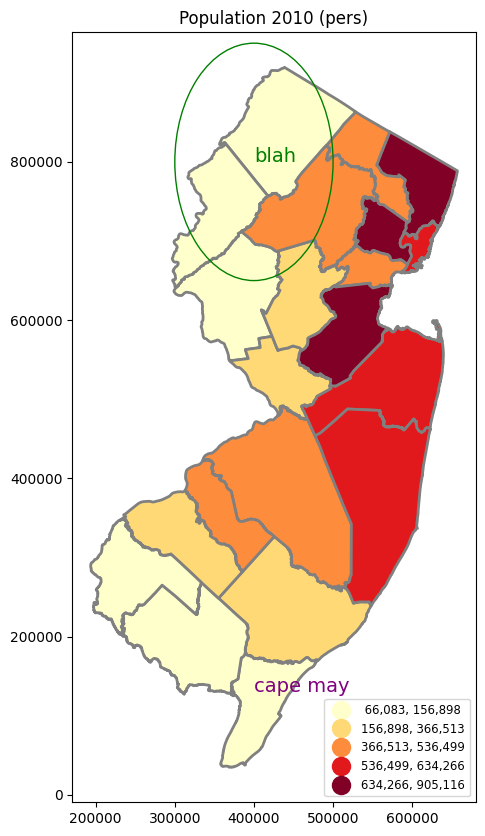

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
ax.title.set_text("Population 2010 (pers)")

ax.text(400000, 800000, r'blah', fontsize=14, color='green')
ax.text(400000, 130000, r'cape may', fontsize=14, color='purple')

from matplotlib.patches import Ellipse
e1 = Ellipse(xy=(400000, 800000), width=200000, height=300000, edgecolor='g', fc='None', lw=1)
ax.add_patch(e1)

<Axes: >

Text(400000, 800000, '❤')

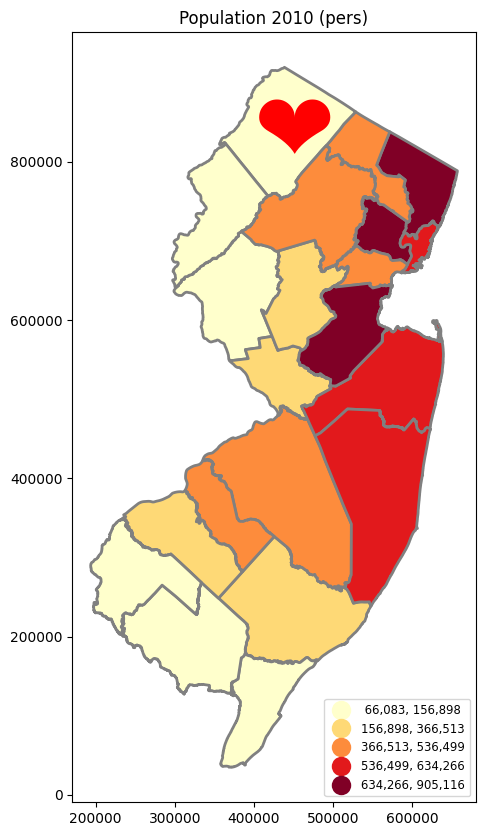

In [ ]:
#emoji
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POP2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
ax.title.set_text("Population 2010 (pers)")

ax.text(400000, 800000, r'❤', fontsize=70,color='red')
#ax.text(400000, 800000, r'👽', fontsize=70,color='red') #can just google emoji, eg https://www.google.com/search?q=emoji+alien%27&rlz=1CAHWSA_enUS1125US1125&oq=emoji+alien%27&gs_lcrp=EgZjaHJvbWUyBggAEEUYOTIHCAEQABiABDIHCAIQABiABDIHCAMQABiABDIHCAQQABiABDIHCAUQABiABDIHCAYQABiABDIICAcQABgWGB4yCAgIEAAYFhgeMggICRAAGBYYHtIBCDQ2NzZqMGo3qAIAsAIA&sourceid=chrome&ie=UTF-8
#some more fancy ones like alien may not render

more info on annotations eg how to add arrow and format annotations:
https://colab.research.google.com/github/theaok/vis/blob/main/all.ipynb#scrollTo=q00k6rAZ8tXo

### [fa25: nov19] mapclassify under the hood

mapclassify we've been using since day 1 in gpd is actually a part of pysal

the whole thing (colors in map) stems from how we bin data--so extra time on details here is useful

In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC
njC=njC0[['COUNTY','COUNTY_LAB','POP2010','POPDEN2010','geometry']]

<Axes: >

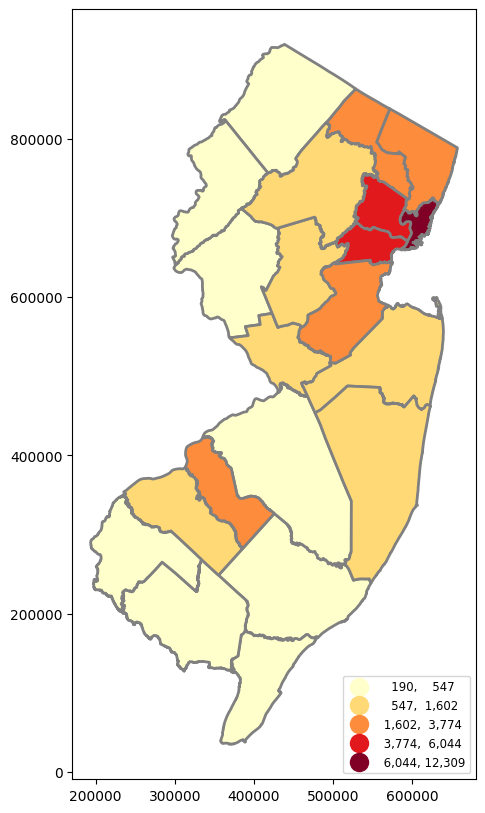

In [ ]:
fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax,column='POPDEN2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

In [ ]:
#https://github.com/pysal/mapclassify
bins =  mapclassify.NaturalBreaks(njC['POPDEN2010'], k=5)
bins
#bins.bins
#bins.counts
#bins.get_legend_classes()

#again and again do pay attention to bins! their span and counts inside

#() enpoints not incl
#[] enpoints incl
#eg 6044 is excluded from top interval

NaturalBreaks

      Interval         Count
----------------------------
[  190.00,   547.00] |     8
(  547.00,  1602.00] |     6
( 1602.00,  3774.00] |     4
( 3774.00,  6044.00] |     2
( 6044.00, 12309.00] |     1

In [ ]:
njC['COUNTY']

,COUNTY
0,ATLANTIC
1,BERGEN
2,BURLINGTON
3,CAMDEN
4,CAPE MAY
5,CUMBERLAND
6,ESSEX
7,GLOUCESTER
8,HUDSON
9,HUNTERDON


In [ ]:
bins.classes #these are the obs in each bin


[[0, 2, 4, 5, 9, 14, 16, 18],
 [7, 10, 11, 12, 15, 19],
 [1, 3, 13, 20],
 [6, 17],
 [8]]

In [ ]:
#mapclassify.util.get_color_array(njC.POPDEN2010, scheme='natural_breaks', cmap='YlOrRd')
hex=mapclassify.util.get_color_array(
    njC.POPDEN2010, scheme="natural_breaks", cmap="YlOrRd", as_hex=True
)
hex

array(['#ffffcc', '#fc8c3b', '#ffffcc', '#fc8c3b', '#ffffcc', '#ffffcc',
       '#e2191c', '#fed875', '#800026', '#ffffcc', '#fed875', '#fed875',
       '#fed875', '#fc8c3b', '#ffffcc', '#fed875', '#ffffcc', '#e2191c',
       '#ffffcc', '#fed875', '#fc8c3b'], dtype=object)

In [ ]:
#see how many obs and set # of bins to that number +1
njC.shape[0]

21

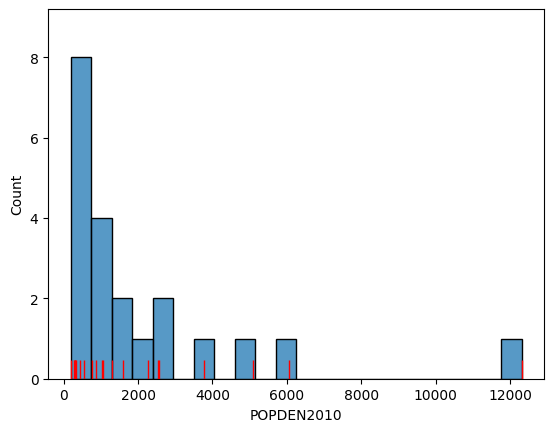

In [ ]:
ax = sns.histplot(njC["POPDEN2010"], bins=22) #one more bin than obs
sns.rugplot(njC["POPDEN2010"], height=0.05, color="red", ax=ax);

<Axes: >

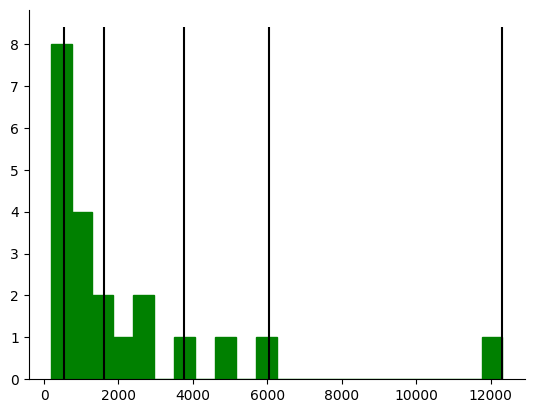

In [ ]:
bins.plot_histogram(color='green',edgecolor='green',bins=22)
#vert line denotes top cutoff for each bin
#note: it does incl whatever even partially is before it
#first bar crsses over the line, but part of it presedees it
# same third bar with 2nd line--these 2obs along with 4 on 2nd bar are in 2nd bin which contains 6obs

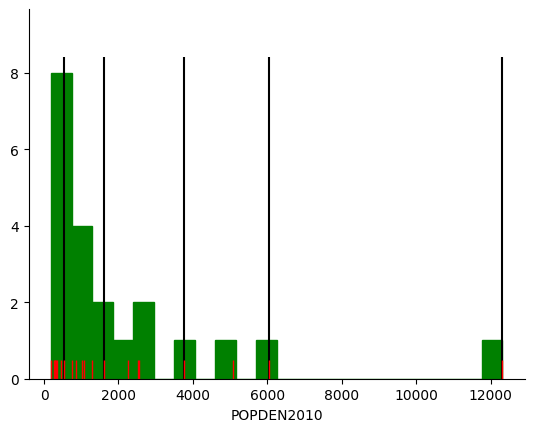

In [ ]:
ax=bins.plot_histogram(color='green',edgecolor='green',bins=22)
sns.rugplot(njC["POPDEN2010"], height=0.05, color="red", ax=ax);

In [ ]:
njC["POPDEN2010"].sort_values() # eg 6044 is excluded from top interval

,POPDEN2010
14,190
16,279
9,293
18,300
5,313
4,340
0,450
2,547
12,761
7,857


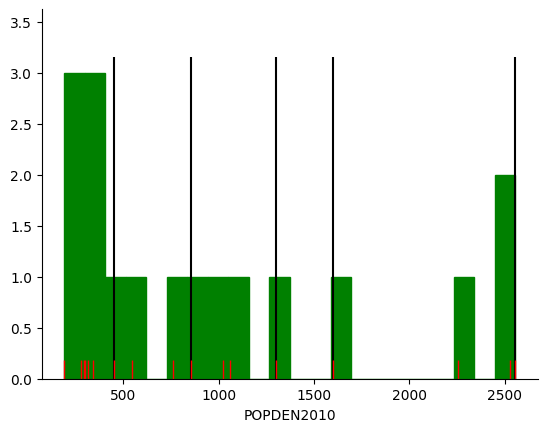

In [ ]:
#zoom in onto lower classes
njC3=njC[njC['POPDEN2010']<3000]
bins3 =  mapclassify.NaturalBreaks(njC3['POPDEN2010'], k=5)
ax=bins3.plot_histogram(color='green',edgecolor='green',bins=22)
sns.rugplot(njC3["POPDEN2010"], height=0.05, color="red", ax=ax);

LATER
ok and the following i got the colors from the map, and i was trying to make a histogram with them, but still trying



In [ ]:
from IPython.display import HTML, display
def disHex(hex_color):
    return HTML(f'<div style="width: 50px; height: 50px; background-color: {hex_color}; border: 1px solid black;"></div>')

display(disHex("#FFC300"))

In [ ]:
import numpy as np
np.unique(hex)


array(['#800026', '#e2191c', '#fc8c3b', '#fed875', '#ffffcc'],
      dtype=object)

In [ ]:
np.unique(hex)[0]


'#800026'

In [ ]:

display(disHex(np.unique(hex)[4]))
#disHex(np.unique(hex)[0])

### basemap (contextily)

https://geopandas.org/en/stable/gallery/plotting_basemap_background.html

they change quite a bit options and basemaps  https://contextily.readthedocs.io/

gallery: https://xyzservices.readthedocs.io/en/stable/gallery.html
 (most dont seem to work)
<br>for interactive mapping (zoom, move, popup) we will use folium/leaflet

In [ ]:
%%capture
! pip install contextily --upgrade
import contextily as cx
#cx.providers

In [ ]:
%%capture
###may break! comment out capture to see output, note just this cell is like 3mb!!

#njC = njC.to_crs(epsg=3857)
ax = njC.plot(figsize=(10, 20),facecolor='none',lw=2 , edgecolor='red') #alpha=0.5  zoom=12
#cx.add_basemap(ax,crs=njC.crs,source=cx.providers.USGS.USTopo)
#cx.add_basemap(ax,crs=njC.crs,source=cx.providers.OpenStreetMap.Mapnik)
cx.add_basemap(ax,crs=njC.crs,source=cx.providers.OpenTopoMap)
#cx.add_basemap(ax,crs=njC.crs, source=cx.providers.CartoDB.PositronNoLabels)
#cx.add_basemap(ax,crs=njC.crs, source=cx.providers.CartoDB.Voyager)
#cx.add_basemap(ax,crs=njC.crs, source=cx.providers.CartoDB.VoyagerNoLabels)
ax.set_axis_off()

### interactive and heat maps [skip]

https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html

https://nbviewer.org/gist/perrygeo/c426355e40037c452434 (heatmaps)

<br>we will use folium/leaflet later instead

<br>but here just a teaser, as of 2026 gpd can do leaflet

In [ ]:
#Interactive Visualization (explore): Native interactive mapping with leafet.js, allowing tooltips, popups, and basemaps.
njC.explore(column="POP2010", tooltip=True)

### [*] dissolve

In [ ]:
!wget -q -O IND.zip https://github.com/theaok/data/raw/main/GIS-INDIA-MAP.zip
zip_ref = zipfile.ZipFile('IND.zip', 'r'); zip_ref.extractall(); zip_ref.close()
i = gpd.read_file('INDIA-MAP.shp')

In [ ]:
i.shape #wow its a lot

(693, 14)

<Axes: >

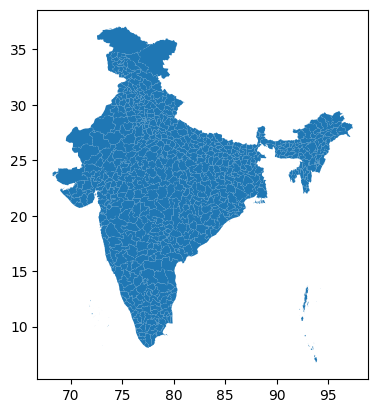

In [ ]:
i.plot()

In [ ]:
states = i.dissolve(by='statename',aggfunc='sum').reset_index()
states = states[['statename', 'distarea', 'totalpopul','totpopmale', 'totpopfema', 'geometry']]
states['statename'] = states['statename'].str.upper()

<Axes: >

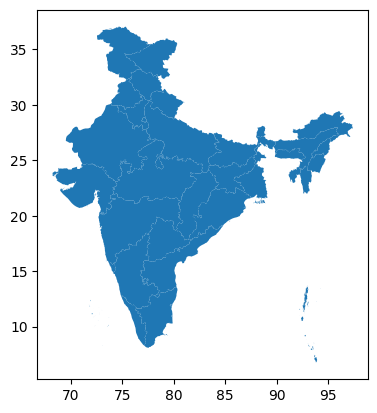

In [ ]:
states.plot()

### [*] projections

skip but if things get weird--mutated shapes, NJ in Pacific, then you have a projection problem

https://automating-gis-processes.github.io/CSC/notebooks/L2/projections.html

<Axes: >

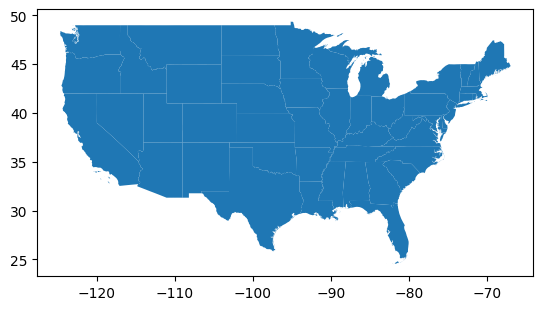

In [ ]:
!wget -q -O us.zip https://github.com/theaok/data/raw/main/cb_2018_us_state_500k.zip
zip_ref = zipfile.ZipFile('us.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
us=gpd.read_file('cb_2018_us_state_500k.shp')
#us.plot()
cont = us[~us['NAME'].isin(['Alaska', 'Hawaii', 'Puerto Rico','American Samoa','United States Virgin Islands','Guam','Commonwealth of the Northern Mariana Islands'])]
cont.plot()

In [ ]:
cont.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

<Axes: >

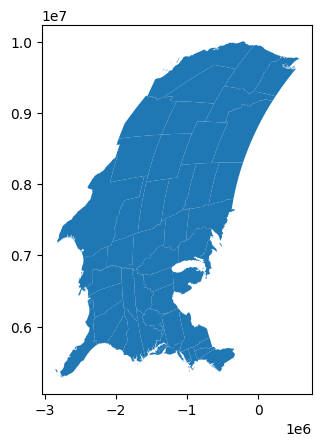

In [ ]:
cont.to_crs(epsg=3035).plot()

In [ ]:
#TODO checkout new
#Coordinates Support: Added has_m and include_m support, enabling management of measure values in geometries.

### [*] point in polygon/intersect, spatial join, nearest neighb

https://automating-gis-processes.github.io/CSC/notebooks/L4/Point-in-polygon.html

https://automating-gis-processes.github.io/CSC/notebooks/L4/spatial-join.html

https://automating-gis-processes.github.io/CSC/notebooks/L4/nearest-neighbour.html


TODO checkout new:
Improved Spatial Joins (sjoin_nearest): Finds nearest features with maximum radius support

### [*] https://towardsdatascience.com/how-to-make-proximity-maps-with-python-da398788e058/

# [oct8] other vis than gis/maps

it's gis--vis with maps, but do other vis too!

In [ ]:
import seaborn as sns #quick pretty wrapper on mpl
import plotly.express as px #a quick simple one; plotly-interactive, fancy
import plotly.graph_objects as go #can get convoluted
import numpy as np
import pandas as pd

In [ ]:
import requests #fake browswer
header = {
  "User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.75 Safari/537.36",
  "X-Requested-With": "XMLHttpRequest"
}

#note can get data straight from url, eg wiki
r = requests.get('https://en.wikipedia.org/wiki/List_of_U.S._states_and_territories_by_race/ethnicity', headers=header)

#dfs = pd.read_html(r.text)

/tmp/ipython-input-2856338138.py:12: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  dfs = pd.read_html(r.text)


In [ ]:
pd.read_html(r.text,match="Mixed")[0].head(5) #for match use header of col; ideally unique; case may matter

#as of 2025 cant do straightup like below need with requests like above
#pd.read_html('https://en.wikipedia.org/wiki/List_of_towns_in_India_by_population',match="Type")[0].head(5)
#pd.read_html("https://en.wikipedia.org/wiki/Premier_League", match = "Position")[0].head(3)
#https://towardsdatascience.com/how-to-use-wikipedia-as-a-data-source-3dfea29e6539
#https://towardsdatascience.com/2-easy-ways-to-get-tables-from-a-website-with-pandas-b92fc835e741 some more ideas

#note if bunch of tables and or cant easily fetch teh right one, just fetch them all
#and then select the right one
#tables=pd.read_html("https://en.wikipedia.org/wiki/List_of_S%26P_500_companies")
#tables[0]
#tables[1]
#etc

/tmp/ipython-input-95693820.py:2: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pd.read_html(r.text,match="Mixed")[0].head(5) #for match use header of col; ideally unique; case may matter


,State,Total Population,White alone (NH),%,Black or African American alone (NH),%.1,Native American or Alaska Native alone (NH),%.2,Asian alone (NH),%.3,Pacific Islander alone (NH),%.4,Some Other Race alone (NH),%.5,Mixed Race or Multi-Racial (NH),%.6,Hispanic or Latino (any race),%.7
0,United States of America (50 states and D.C.),331449281,191697647,57.84%,39940338,12.05%,2251699,0.68%,19618719,5.92%,622018,0.19%,1689833,0.51%,13548983,4.09%,62080044,18.73%
1,"United States of America (50 states, D.C., an...",334735155,191722195,57.28%,39944624,11.93%,2252011,0.67%,19621465,5.86%,622109,0.19%,1692341,0.51%,13551323,4.05%,65329087,19.52%
2,Alabama,5024279,3171351,63.12%,1288159,25.64%,23119,0.46%,75918,1.51%,2612,0.05%,14455,0.29%,184618,3.67%,264047,5.26%
3,Alaska,733391,421758,57.51%,20731,2.83%,108838,14.84%,43449,5.92%,12455,1.70%,4575,0.62%,71761,9.78%,49824,6.79%
4,Arizona,7151502,3816547,53.37%,317161,4.43%,263930,3.69%,248837,3.48%,14323,0.20%,31611,0.44%,266840,3.73%,2192253,30.65%


In [ ]:
auto=pd.read_stata('https://docs.google.com/uc?id=1YpkQ-RgAQfB_4olxtbfRWnVmKwkXml5N&export=download')

In [ ]:
auto[:10].style.background_gradient(cmap='Greens') #RdYlGn #https://seaborn.pydata.org/tutorial/color_palettes.html

,make,price,mpg,rep78,headroom,trunk,weight,length,turn,displacement,gear_ratio,foreign
0,AMC Concord,4099,22,3.000000,2.500000,11,2930,186,40,121,3.580000,Domestic
1,AMC Pacer,4749,17,3.000000,3.000000,11,3350,173,40,258,2.530000,Domestic
2,AMC Spirit,3799,22,nan,3.000000,12,2640,168,35,121,3.080000,Domestic
3,Buick Century,4816,20,3.000000,4.500000,16,3250,196,40,196,2.930000,Domestic
4,Buick Electra,7827,15,4.000000,4.000000,20,4080,222,43,350,2.410000,Domestic
5,Buick LeSabre,5788,18,3.000000,4.000000,21,3670,218,43,231,2.730000,Domestic
6,Buick Opel,4453,26,nan,3.000000,10,2230,170,34,304,2.870000,Domestic
7,Buick Regal,5189,20,3.000000,2.000000,16,3280,200,42,196,2.930000,Domestic
8,Buick Riviera,10372,16,3.000000,3.500000,17,3880,207,43,231,2.930000,Domestic
9,Buick Skylark,4082,19,3.000000,3.500000,13,3400,200,42,231,3.080000,Domestic


<Axes: >

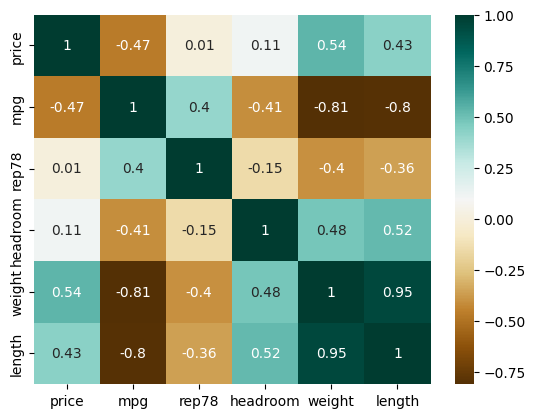

In [ ]:
sns.heatmap(auto[['price','mpg','rep78','headroom','weight','length']].corr().round(2),cmap="BrBG",annot=True) # RdYlGn love the colors!

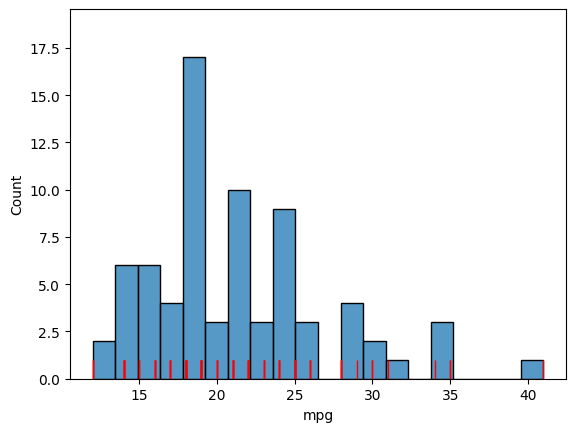

In [ ]:
#auto.mpg.hist(bins=20)
ax = sns.histplot(auto["mpg"], bins=20)
# Add rug on horizontal axis
sns.rugplot(auto["mpg"], height=0.05, color="red", ax=ax);

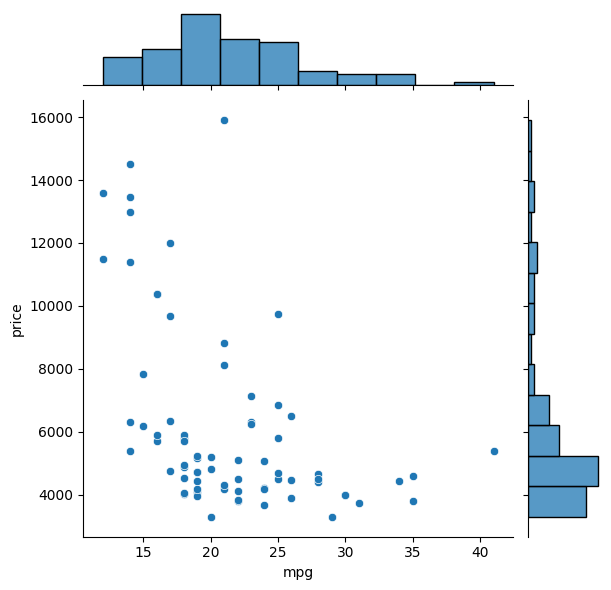

In [ ]:
sns.jointplot(x ='mpg', y ='price', data = auto)

In [ ]:
px.scatter(auto, x="weight", y="mpg", color="price",
                  hover_data=['make'],width=1000,height=600)

In [ ]:
#for cat data do crosstab, a visual version is density heatmap
px.density_heatmap(auto, x="rep78", y="headroom", marginal_x="histogram", marginal_y="histogram")

In [ ]:
df = px.data.gapminder().query("year == 2007")
px.treemap(df, path=[px.Constant("world"), 'continent', 'country'], values='pop',
                 color='lifeExp', hover_data=['iso_alpha'],
                  color_continuous_scale='RdBu',
                 color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))

# [oct15] raster (picture)
remember slide from https://theaok.github.io/gisPy/data.pdf:

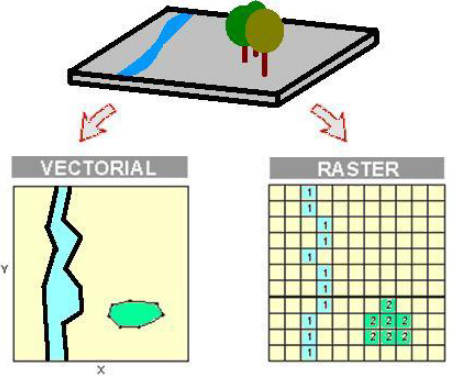

at least 3  applications (way more, be creative, use raster!):

1) over time: explain present with past, eg
redlining (vector) and contaminations: https://theaok.github.io/gis/gisGoodExampleOfFinalProject.pdf (vector, but redlining vector based on pictures/raster paper maps)

2) over time changes, eg melting ice caps https://earthengine.google.com/timelapse/

3) across space, eg
concrete in tx v nature in nj p43 https://drive.google.com/open?id=1Coj3CuwvzyoF2Rm_a0Fg5sSOXkTzuZlV


first images by hand (later API)

Just like for shapefile we googled "NJ counties shape file"
now we do sth like "NJ raster data download"

and so i found NJ dept of geog, and we pull raster data from:

https://newjersey.maps.arcgis.com/apps/webappviewer/index.html?id=d13ac68c0d0f46139673824bbf19ad66
zoom in click on tile and copy link to (geo)tif

In [ ]:
#using rasterio lib
#https://rasterio.readthedocs.io/en/latest/topics/plotting.html
#https://geopandas.org/en/stable/gallery/geopandas_rasterio_sample.html

!pip install rasterio
import rasterio
import matplotlib.pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 94.1 MB/s eta 0:00:00


In [ ]:
#1930 tile145
!wget -q -O tile145.tif https://njogis-imagery.s3-us-west-2.amazonaws.com/1930/cog/tile145.tif #this is url to img src
src = rasterio.open("tile145.tif")
src.bounds #note bounds, these would be coords on x and y

BoundingBox(left=299560.2562470367, bottom=383483.5169948095, right=329077.91377203667, top=422472.6327158095)

In [ ]:
%%capture
#del capture above just to make notebook smaller

fig, ax = plt.subplots(figsize=(20, 16))
ax.set_ylim([3000,2000]) #zoom onto waterfront
ax.set_xlim([2000,3000])
#ax.set_aspect(1/3)

ax.imshow(src.read(1)) #, aspect='auto',extent=[1500,5000,2000,20000]
#zorder=1,alpha=.6,interpolation='nearest'

#blurry, but still pretty awesome as for 1930!

In [ ]:
#250mb each! give it like 20sec to download
!wget -q -O D13C14-07.tif https://njogis-imagery.s3-us-west-2.amazonaws.com/2007/cog/D13C14.tif
src07 = rasterio.open("D13C14-07.tif")
!wget -q -O D13C14-20.tif https://njogis-imagery.s3.us-west-2.amazonaws.com/2020/cog/D13C14.tif
src20 = rasterio.open("D13C14-20.tif")
#src07.bounds

In [ ]:
%%capture
#del capture above just to make notebook smaller

fig, ax = plt.subplots(figsize=(20, 20))
#ax.set_ylabel('price')
#ax.set_xlabel('sdsa')
ax.set_ylim([5000,0])
ax.set_xlim([0,2000])
#ax.set_aspect(1/3)

ax.imshow(src07.read(1)) #, aspect='auto',extent=[1500,5000,2000,20000]
#zorder=1,alpha=.6,interpolation='nearest'

In [ ]:
%%capture
#del capture above just to make notebook smaller

fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True,figsize=(20, 20)) #1row2col
axs[0].imshow(src07.read(1))
axs[1].imshow(src20.read(1))
axs[0].set_ylim([5000,0])
axs[0].set_xlim([0,2000])
axs[1].set_ylim([5000,0])
axs[1].set_xlim([0,2000])
axs[0].set_title('2007 prison, ru stadium')
axs[1].set_title('2020 american water, hilton');

btw google street view has time too! eg:<br>
https://www.google.com/maps/place/401+Cooper+St,+Camden,+NJ+08102/@39.9471578,-75.1218999,3a,75y,14.87h,90t/data=!3m7!1e1!3m5!1sITXQj8a5aM3Xj91QOfu4Fw!2e0!6s%2F%2Fgeo0.ggpht.com%2Fcbk%3Fpanoid%3DITXQj8a5aM3Xj91QOfu4Fw%26output%3Dthumbnail%26cb_client%3Dsearch.gws-prod%2Fmaps%2Flocal-details-getcard.gps%26thumb%3D2%26w%3D86%26h%3D86%26yaw%3D14.87242%26pitch%3D0%26thumbfov%3D100!7i13312!8i6656!4m5!3m4!1s0x89c6c8f0e64a7e77:0xb5b160dc340e83ec!8m2!3d39.9473113!4d-75.121837

### [oct22][*] raster+vector (careful with crs)


In [ ]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC0=gpd.read_file('nj_counties.shp') #
c=njC0[njC0.COUNTY=="CAMDEN"] #camden county

! wget -q -O tracts.zip https://github.com/theaok/data/raw/main/tl_2019_34_tract.zip
zip_ref = zipfile.ZipFile('tracts.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
tracts=gpd.read_file('tl_2019_34_tract.shp')
tractsCam=tracts[tracts.COUNTYFP=='007'] #tracts in camden county

In [ ]:
%%capture
!wget -q -O tile145.tif https://njogis-imagery.s3-us-west-2.amazonaws.com/1930/cog/tile145.tif #this is url to img src
src = rasterio.open("tile145.tif")
src.bounds #note extent (and in map's axes) x:300-330k y: 385k-420k
fig, ax = plt.subplots(figsize=(20, 10))
#ax.set_ylim([10000,1000]) #[3000,2000]
#ax.set_xlim([1000,10000]) #
#ax.set_aspect(1/3)
from rasterio.plot import show
rasterio.plot.show(src, ax=ax,)

In [ ]:
src.crs

CRS.from_wkt('LOCAL_CS["unnamed",UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]')

In [ ]:
c.crs #projected has 'weird corrds' in thousands

<Projected CRS: EPSG:3424>
Name: NAD83 / New Jersey (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New Jersey - counties of Atlantic; Bergen; Burlington; Camden; Cape May; Cumberland; Essex; Gloucester; Hudson; Hunterdon; Mercer; Middlesex; Monmouth; Morris; Ocean; Passaic; Salem; Somerset; Sussex; Union; Warren.
- bounds: (-75.6, 38.87, -73.88, 41.36)
Coordinate Operation:
- name: SPCS83 New Jersey zone (US survey foot)
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: >

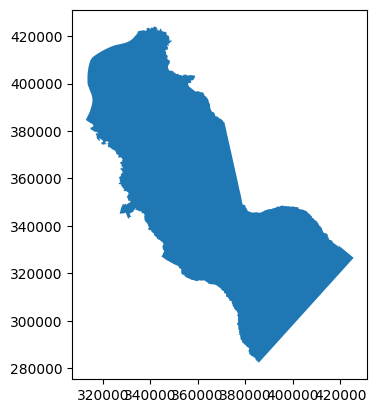

In [ ]:
c.plot() #our vector c coords matche raster src, so can map straight up

<Axes: >

<Axes: >

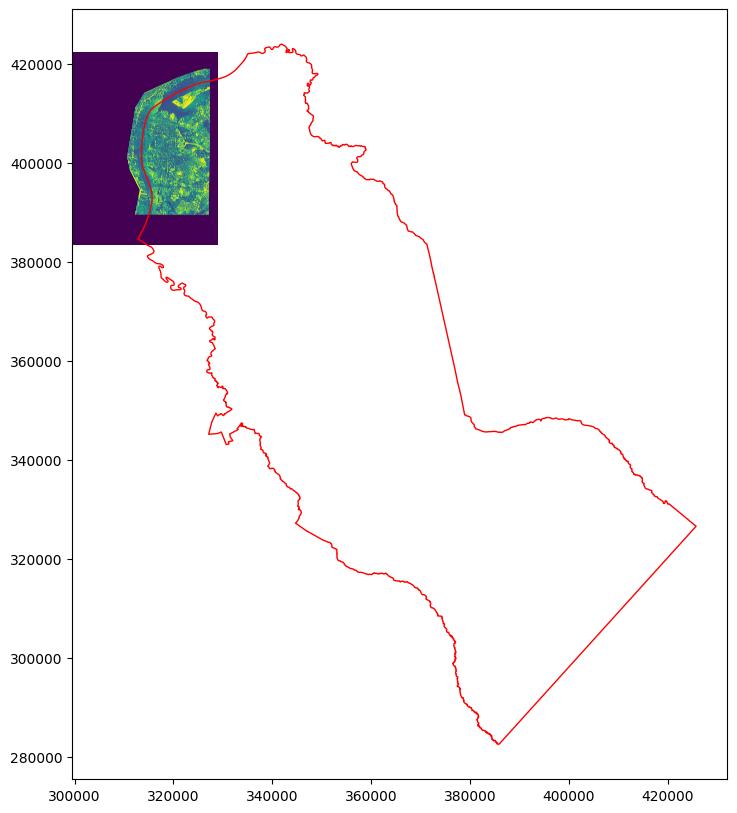

In [ ]:

fig, ax = plt.subplots(figsize=(20, 10))
from rasterio.plot import show
rasterio.plot.show(src, ax=ax,) #, cmap="pink"
#ax.imshow(src.read(1))
c.plot(ax=ax,edgecolor='red',linewidth=1, facecolor="none")

In [ ]:
%%capture
#doesnt overlap! so crs problem!!
fig, ax = plt.subplots(figsize=(20, 20))
ax.set_ylim([385000,420000]) #[3000,2000]
ax.set_xlim([310000,330000]) #

from rasterio.plot import show
rasterio.plot.show(src, ax=ax,) #, cmap="pink"
#ax.imshow(src.read(1))
tractsCam.plot(ax=ax,edgecolor='white',linewidth=1, facecolor="none")

In [ ]:
tractsCam.crs #geographic is lat -90 - 90 and lon -180 to 180

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [ ]:
tractsCam2 = tractsCam.to_crs(c.crs) #so have to transform (using c county from earlier that worked)
#tractsCam3 = tractsCam.to_crs(src20.crs) #can use newer raster to transform vector too

In [ ]:
%%capture
fig, ax = plt.subplots(figsize=(20, 20))
ax.set_ylim([385000,420000]) #[3000,2000]
ax.set_xlim([310000,330000]) #

from rasterio.plot import show
rasterio.plot.show(src, ax=ax,) #, cmap="pink"
#ax.imshow(src.read(1))
tractsCam2.plot(ax=ax,edgecolor='purple',linewidth=3, facecolor="none")

### [*] goog raster (API) [complicated]

there's a ton! landsat, sentinel among others
see https://developers.google.com/earth-engine/datasets/ (temp, climate, etc)

landsat and sentinel major satelite images as far as i can tell (i don't really use raster in my own work so far unfortuntalely)



In [ ]:
#https://developers.google.com/earth-engine/guides/python_install
import ee
ee.Authenticate()
ee.Initialize(project='elaborate-karma-195918')#!! you need to register your own at https://console.cloud.google.com/earth-engine/configuration/manage-registration
print(ee.String('Hello from the Earth Engine servers!').getInfo())

Hello from the Earth Engine servers!


#### landsat tutorial

In [ ]:
landsat_collection = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2') #can figure out from above url documentation
#landsat_collection = ee.ImageCollection('LANDSAT/LE07/C02/T1_L2')  # Landsat 7 raw images collection
#landsat_collection = ee.ImageCollection("LANDSAT/LC08/C02/T1_SR")

In [ ]:
#apparently needs to rescale stuff, otherwhise im getting white square; following:
#https://gis.stackexchange.com/questions/473155/landsat-imagery-showing-up-as-white-in-gee
#https://gis.stackexchange.com/questions/421643/scale-factors-application-not-working-on-gee-pyqgis
#https://developers.google.com/earth-engine/landsat_c1_to_c2

# Applies scaling factors.
def apply_scale_factors(image):
  optical_bands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
  thermal_bands = image.select('ST_B.*').multiply(0.00341802).add(149.0)
  return image.addBands(optical_bands, None, True).addBands(
      thermal_bands, None, True
  )


In [ ]:
    # Filter by date
    filtered_collection = landsat_collection.filterDate('2023-01-01', '2023-12-31').map(apply_scale_factors)

    # Filter by a region (example: a point and buffer)
    point = ee.Geometry.Point([-74.0060, 40.7128]) # Example: New York City
    region_of_interest = point.buffer(10000) # 10 km buffer
    filtered_collection = filtered_collection.filterBounds(region_of_interest)

    # Select a single image (e.g., the least cloudy)
    image = filtered_collection.sort('CLOUD_COVER').first()

    # Or create a median composite
    # image = filtered_collection.median()

In [ ]:
import geemap #basemap to orient ourselves where we are
#        vis_params = {
#        'bands': ['SR_B4', 'SR_B3', 'SR_B2'], # Red, Green, Blue bands for true color
#        'min': 0,
#        'max': 3000, # Adjust max based on your data and desired contrast
#        'gamma': 1.4 # Optional gamma correction
#    }

#visualization parameters--read the documentation, i just took from tutorial these values
vis_params = {'bands': ['SR_B5','SR_B4','SR_B3'],
              'min': 0,
              'max': 0.3}

m = geemap.Map()
m.centerObject(region_of_interest, 10) # Center the map on your region
m.addLayer(image, vis_params, 'Landsat Image')
m # Display the map

Map(center=[40.71281025887327, -74.00599962467349], controls=(WidgetControl(options=['position', 'transparent_…

In [ ]:
landsat_collection = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2")
    # Example: filter by date and bounds
filtered_image = landsat_collection.filterDate('2023-01-01', '2023-12-31') \
                                   .filterBounds(ee.Geometry.Point(-122.4, 37.7)) \
                                   .sort('CLOUD_COVER') \
                                   .map(apply_scale_factors)  \
                                   .first()

#vis_params = {
#    'bands': ['SR_B4', 'SR_B3', 'SR_B2'],  # Red, Green, Blue bands for true color
#    'min': 0,
#    'max': 3000,
#    'gamma': 1.4
#}

vis_params = {'bands': ['SR_B5','SR_B4','SR_B3'],
              'min': 0,
              'max': 0.3}

m = geemap.Map()
m.centerObject(filtered_image, 10)
m.addLayer(filtered_image, vis_params, 'Landsat Image')
m

Map(center=[37.47329718754303, -122.11500925234661], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
m = geemap.Map(center=[33, -87], zoom=8)

#Dates for imagery acquisition
i_date = '2020-01-01'
f_date = '2020-12-30'

#AOI point in Alabama
my_AOI = ee.Geometry.Point([-87, 33])

#Fetching Landsat 8 RGB as ee Image Collection for 2020
landsat = (
    ee.ImageCollection("LANDSAT/LC08/C02/T1_L2")
    .filterDate(i_date,f_date)
    .filterBounds(my_AOI)
    # Adjust each image in the collection to the correct range
    .map(apply_scale_factors)
    .min()
)

#Corresponding bands for L8
red = landsat.select("SR_B4")
green = landsat.select("SR_B3")
blue = landsat.select("SR_B2")

rgb_params = {'bands': ['SR_B5','SR_B4','SR_B3'],
              'min': 0,
              'max': 0.3}
m.addLayer(landsat, rgb_params, 'Landsat Image')
#m.addLayer(landsat, vis_params, 'Landsat Image')
m

Map(center=[33, -87], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(chi…

there's another totorial here and looks useful--can get good looking images, not reddish stuff like above
https://climada-python.readthedocs.io/en/stable/user-guide/climada_util_earth_engine.html

In [ ]:
# Access a specific image
image = ee.Image("LANDSAT/LC08/C01/T1_TOA/LC08_044034_20140318")
# Landsat 8 image, with Top of Atmosphere processing, on 2014/03/18

# Access a collection
collection = "LANDSAT/LE07/C01/T1"  # Landsat 7 raw images collection

## skip the rest for now!!!

#### goog tutorial
https://developers.google.com/earth-engine/tutorials/community/intro-to-python-api


In [ ]:
# Import the MODIS land cover collection.
lc = ee.ImageCollection('MODIS/006/MCD12Q1')

# Import the MODIS land surface temperature collection.
lst = ee.ImageCollection('MODIS/006/MOD11A1')

# Import the USGS ground elevation image.
elv = ee.Image('USGS/SRTMGL1_003')

In [ ]:
# Initial date of interest (inclusive).
i_date = '2017-01-01'

# Final date of interest (exclusive).
f_date = '2020-01-01'

# Selection of appropriate bands and dates for LST.
lst = lst.select('LST_Day_1km', 'QC_Day').filterDate(i_date, f_date)

In [ ]:
# Define the urban location of interest as a point near Lyon, France.
u_lon = 4.8148
u_lat = 45.7758
u_poi = ee.Geometry.Point(u_lon, u_lat)

# Define the rural location of interest as a point away from the city.
r_lon = 5.175964
r_lat = 45.574064
r_poi = ee.Geometry.Point(r_lon, r_lat)

In [ ]:
scale = 1000  # scale in meters

# Print the elevation near Lyon, France.
elv_urban_point = elv.sample(u_poi, scale).first().get('elevation').getInfo()
print('Ground elevation at urban point:', elv_urban_point, 'm')

# Calculate and print the mean value of the LST collection at the point.
lst_urban_point = lst.mean().sample(u_poi, scale).first().get('LST_Day_1km').getInfo()
print('Average daytime LST at urban point:', round(lst_urban_point*0.02 -273.15, 2), '°C')

# Print the land cover type at the point.
lc_urban_point = lc.first().sample(u_poi, scale).first().get('LC_Type1').getInfo()
print('Land cover value at urban point is:', lc_urban_point)

Ground elevation at urban point: 196 m
Average daytime LST at urban point: 23.12 °C
Land cover value at urban point is: 13


In [ ]:
# Define a region of interest with a buffer zone of 1000 km around Lyon.
roi = u_poi.buffer(1e6)

# Reduce the LST collection by mean.
lst_img = lst.mean()

# Adjust for scale factor.
lst_img = lst_img.select('LST_Day_1km').multiply(0.02)

# Convert Kelvin to Celsius.
lst_img = lst_img.select('LST_Day_1km').add(-273.15)

from IPython.display import Image

# Create a URL to the styled image for a region around France.
url = lst_img.getThumbUrl({
    'min': 10, 'max': 30, 'dimensions': 512, 'region': roi,
    'palette': ['blue', 'yellow', 'orange', 'red']})
print(url)

# Display the thumbnail land surface temperature in France.
print('\nPlease wait while the thumbnail loads, it may take a moment...')
Image(url=url)

https://earthengine.googleapis.com/v1/projects/elaborate-karma-195918/thumbnails/3bc4413e4552eae1fc382b446c52ce06-021f2a60fa1c32f3010f6cb6c56208c0:getPixels

Please wait while the thumbnail loads, it may take a moment...


In [ ]:
# Make pixels with elevation below sea level transparent.
elv_img = elv.updateMask(elv.gt(0))

# Display the thumbnail of styled elevation in France.
Image(url=elv_img.getThumbURL({
    'min': 0, 'max': 2000, 'dimensions': 512, 'region': roi,
    'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']}))

#### temp geemap example

In [ ]:
import geemap

jan_2023_climate = (
    ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR')
    .filterDate('2023-01', '2023-02')
    .first()
)

# Instantiate a geemap Map object
m = geemap.Map(center=[30, 0], zoom=2)

# Define visualization parameters for the temperature band
vis_params = {
    'bands': ['temperature_2m'],
    'min': 229,  # Minimum temperature in Kelvin
    'max': 304,  # Maximum temperature in Kelvin
    'palette': 'inferno', # Color palette for visualization
}

# Add the temperature band as a layer to the map
m.add_layer(jan_2023_climate, vis_params, 'Temperature (K)')

# Display the map (this will open an interactive map if run in a Jupyter-like environment)
m

Map(center=[30, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(child…

#### other APIa and other ideas
can get sat img straight to python, via API, eg

https://carpentries-incubator.github.io/geospatial-python/

https://sites.northwestern.edu/researchcomputing/2021/11/19/downloading-satellite-images-made-easy/

https://earthengine.google.com/timelapse/
very cool lets do default Columbia glacier 84 v 22 (pause; by hand)

and las vegas, same contrast, note less water, too (others:  urban growth, deforestation, etc)


check out Global Gridded Relative Deprivation Index (GRDI)
https://www.earthdata.nasa.gov/news/feature-articles/measuring-relative-poverty-deprivation-around-globe

# for nat sci people

https://www.pyngl.ucar.edu/Examples/gallery.shtml

https://cdat.llnl.gov/gallery.html

# notes to myself

### fa24

### 2023

TODO if anything go thru gpd again esp as more features being added!
<br>

the whole course, geo dat sci: [oct2023 not super urgent; skimmed thru it already]
https://darribas.org/gds_course/content/home.html

<br>oct2023 found 1 more; already incorporated most useful stuff , still  a useful reference:

old  version:
https://automating-gis-processes.github.io/CSC/index.html

new version:
https://autogis-site.readthedocs.io/en/latest/



<br>
LATER/MAYBE: [oct2023 but meh not clear advantage over gpd/folium]
 basemap! guess the first one! used to use it, but dead, depreciated in favor of cartopy
https://jakevdp.github.io/PythonDataScienceHandbook/04.13-geographic-data-with-basemap.html